# Documentation

### Code Details

Author            : Sagar Ladhwani (LinkedIn: https://www.linkedin.com/in/sagar-ladhwani-713b96112/) <br>
Created On        : 31st May 2021 <br>
Last Modifiied On : 31st May 2021 <br>
Code Descr        : A detailed tracker of India's Covid-19 Pandemic & Vaccination Drive

### Importing Required Libraries

In [1]:
import pandas as pd
import numpy as np
import warnings
import os
import datetime as dt
from datetime import datetime 
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import plotly.graph_objects as go
from matplotlib.dates import DateFormatter
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter, AutoMinorLocator)

In [2]:
## Ignoring Warnings
warnings.filterwarnings('ignore')

In [3]:
## Getting terminal width for better printing later on
width = os.get_terminal_size().columns

# 1. Covid Cases Data

## Data Exploration

In [4]:
## Read the cases data from Covid API
cases = pd.read_csv("https://api.covid19india.org/csv/latest/states.csv")
print(cases.shape)
cases.head()

(16023, 7)


,Date,State,Confirmed,Recovered,Deceased,Other,Tested
0,2020-01-30,Kerala,1,0,0,0,NaN
1,2020-01-30,India,1,0,0,0,NaN
2,2020-02-02,Kerala,2,0,0,0,NaN
3,2020-02-02,India,2,0,0,0,NaN
4,2020-02-03,Kerala,3,0,0,0,NaN


In [5]:
## Drop unnecessary columns and Unassigned Cases
cases.drop(['Other','Tested'],axis=1,inplace=True)
cases = cases[cases['State']!='State Unassigned']
cases.shape

(15955, 5)

In [6]:
## Create required columns
cases['Active'] = cases.Confirmed - cases.Recovered - cases.Deceased
cases['Recovered/Deceased'] = cases.Recovered + cases.Deceased
cases.head()

,Date,State,Confirmed,Recovered,Deceased,Active,Recovered/Deceased
0,2020-01-30,Kerala,1,0,0,1,0
1,2020-01-30,India,1,0,0,1,0
2,2020-02-02,Kerala,2,0,0,2,0
3,2020-02-02,India,2,0,0,2,0
4,2020-02-03,Kerala,3,0,0,3,0


In [7]:
## Change type of Date column
cases['Date'] = pd.to_datetime(cases['Date'])
cases.dtypes

Date                  datetime64[ns]
State                         object
Confirmed                      int64
Recovered                      int64
Deceased                       int64
Active                         int64
Recovered/Deceased             int64
dtype: object

In [8]:
## Check for null values (if any)
cases.isna().sum()

Date                  0
State                 0
Confirmed             0
Recovered             0
Deceased              0
Active                0
Recovered/Deceased    0
dtype: int64

In [9]:
## Create a list of all states removing India from the list
states = list(np.sort(cases['State'].unique()))
states.remove('India')
print(states)

['Andaman and Nicobar Islands', 'Andhra Pradesh', 'Arunachal Pradesh', 'Assam', 'Bihar', 'Chandigarh', 'Chhattisgarh', 'Dadra and Nagar Haveli and Daman and Diu', 'Delhi', 'Goa', 'Gujarat', 'Haryana', 'Himachal Pradesh', 'Jammu and Kashmir', 'Jharkhand', 'Karnataka', 'Kerala', 'Ladakh', 'Lakshadweep', 'Madhya Pradesh', 'Maharashtra', 'Manipur', 'Meghalaya', 'Mizoram', 'Nagaland', 'Odisha', 'Puducherry', 'Punjab', 'Rajasthan', 'Sikkim', 'Tamil Nadu', 'Telangana', 'Tripura', 'Uttar Pradesh', 'Uttarakhand', 'West Bengal']


## a. Trend of Confirmed, Recovered/Deceased and Active Cases over time

In [10]:
## Defining starting and end points for analysis
start_date = datetime(2021, 1, 1)
end_date = datetime(2021, 6, 15)

In [11]:
## Define a function to plot time-series cases trend
def plot_conf_rec_act(state_name):
    
    ## Filter for State and Analysis Time Period
    state_df = cases[cases['State']==state_name]
    state_df = state_df[(state_df['Date']>=start_date) & (state_df['Date']<=end_date)]
    state_df['Mon-Year'] = state_df.Date.dt.strftime("%b-%Y")
    state_df.reset_index(drop=True,inplace=True)
    
    ## Creating a separate Dataframe for plotting text at monthly interval and last data point
    first_dates_df = state_df.loc[state_df.groupby(['Mon-Year'])['Date'].idxmin()]
    first_dates_df = first_dates_df.append(state_df.loc[state_df.index[-1]])
    
    ## Creating plots
    fig, ax = plt.subplots(figsize=(15,6))

    ## Plots for Confirmed, Recovered/Deceased and Active cases with markers at monthly interval and last data point
    markers_on = list(first_dates_df.index) + [state_df.index[-1]]
    ax.plot(state_df.Date,state_df.Confirmed,marker='o',markevery=markers_on,label='Confirmed')
    ax.plot(state_df.Date,state_df['Recovered/Deceased'],marker='^',markevery=markers_on,label='Recovered/Deceased')
    ax.plot(state_df.Date,state_df.Active,marker='D',markevery=markers_on,label='Active')
    ax.legend(loc='upper right',bbox_to_anchor=(1.225, 1.005))

    ## Formatting X-axis for appropriate Date format, Major and Minor Ticks along with axis limits
    date_form = DateFormatter("%b-%y")
    ax.xaxis.set_major_formatter(date_form)
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
    ax.xaxis.set_minor_locator(mdates.WeekdayLocator(byweekday=start_date.weekday()))
    ax.set_xlim([start_date - dt.timedelta(5), end_date])
    ax.set_ylim(top=state_df.Confirmed.max()*1.2)

    ## Using a loop to plot text for all the points of each of the 3 trend lines
    for i in range(len(first_dates_df)):
        ax.text(mdates.date2num(first_dates_df.Date.iloc[i])-2,1.1*first_dates_df.Confirmed.iloc[i],'{:,}'.format(first_dates_df.Confirmed.iloc[i]))
        ax.text(mdates.date2num(first_dates_df.Date.iloc[i])-2,0.8*first_dates_df['Recovered/Deceased'].iloc[i],'{:,}'.format(first_dates_df['Recovered/Deceased'].iloc[i]))
        ax.text(mdates.date2num(first_dates_df.Date.iloc[i])-2,first_dates_df.Active.iloc[i] + 0.05*first_dates_df.Confirmed.iloc[i],'{:,}'.format(first_dates_df.Active.iloc[i]))
    
    ## Adding labels
    plt.xlabel('Month-Year')
    plt.ylabel('Count')
    plt.title('Total Covid-19 Cases in '+state_name)
    #ax.legend()
    plt.show()

In [12]:
## Setting Style and Context for Seaborn plots along with colors to be used
sns.set_style('darkgrid')
sns.set_context('notebook',font_scale=1.2)
colors = sns.color_palette('muted')

### Visualizations

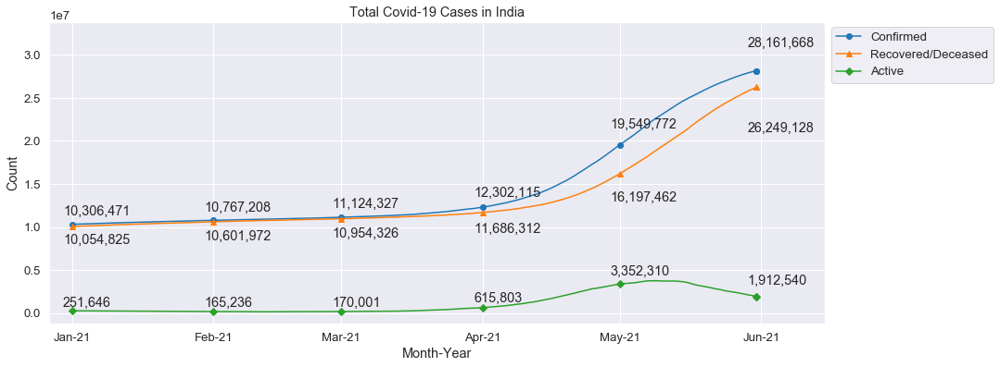

In [13]:
## Plotting time-series of Confirmed, Recovered/Deceased and Active cases for India as a whole
plot_conf_rec_act('India')

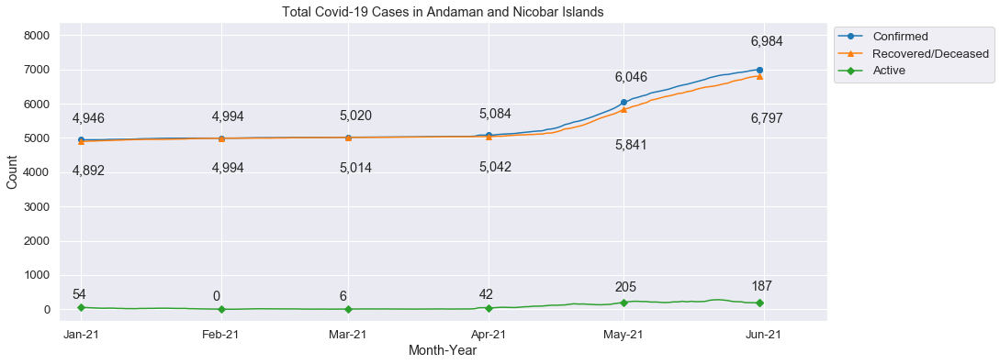

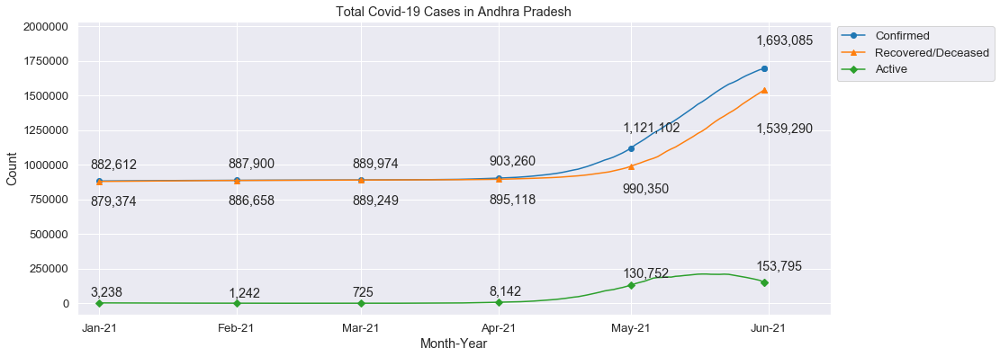

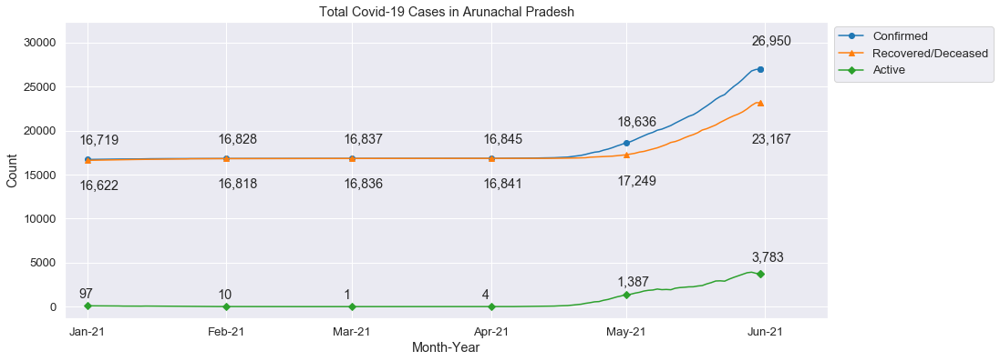

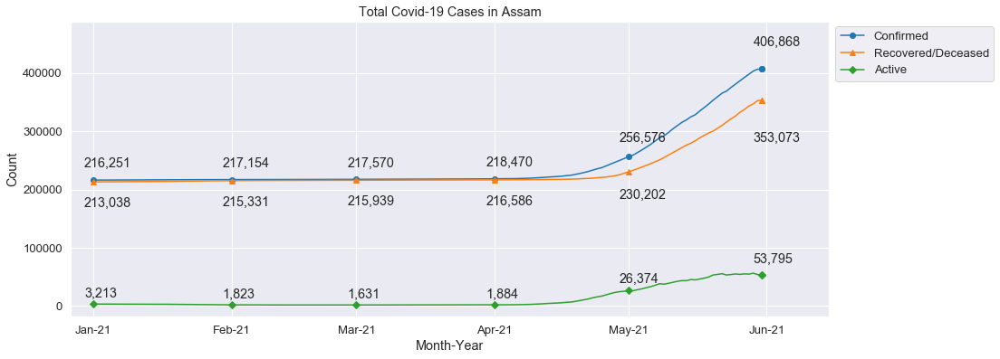

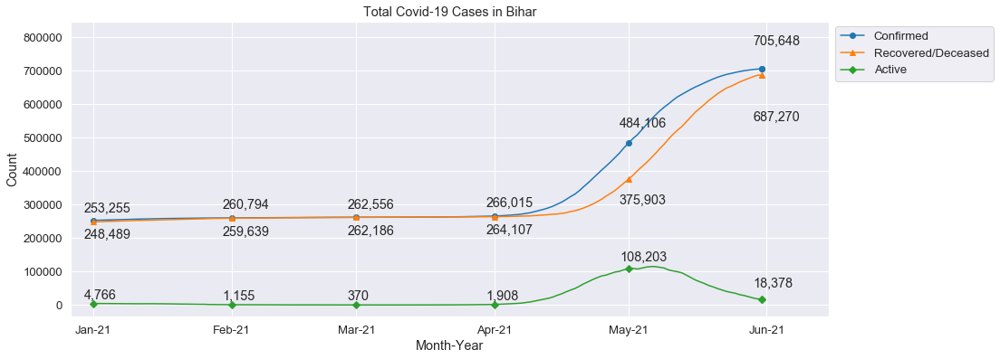

...

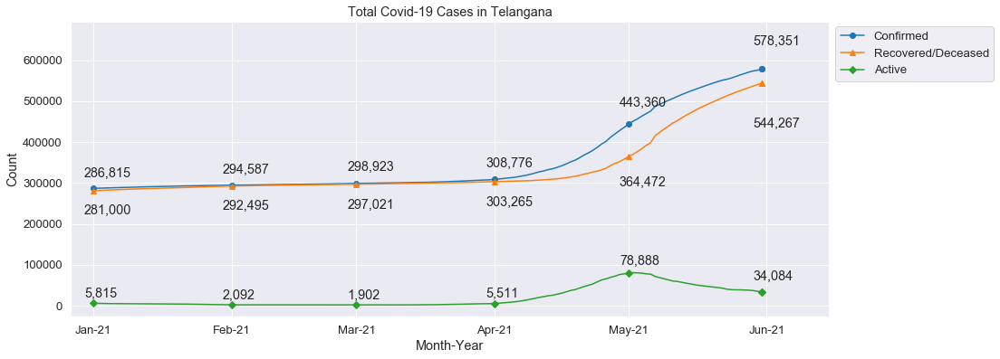

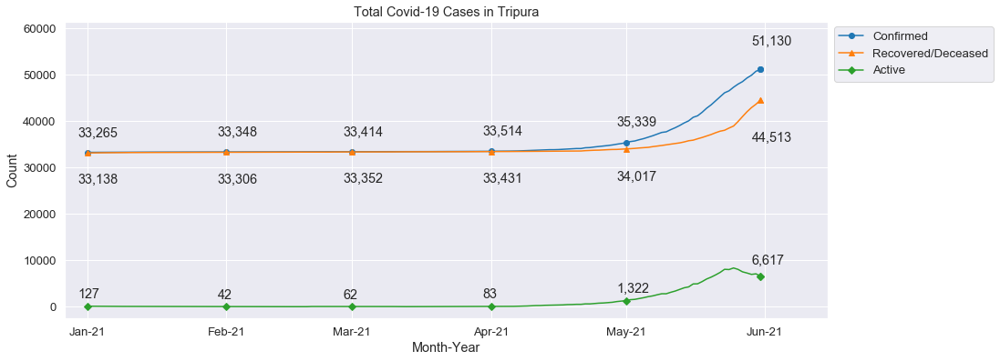

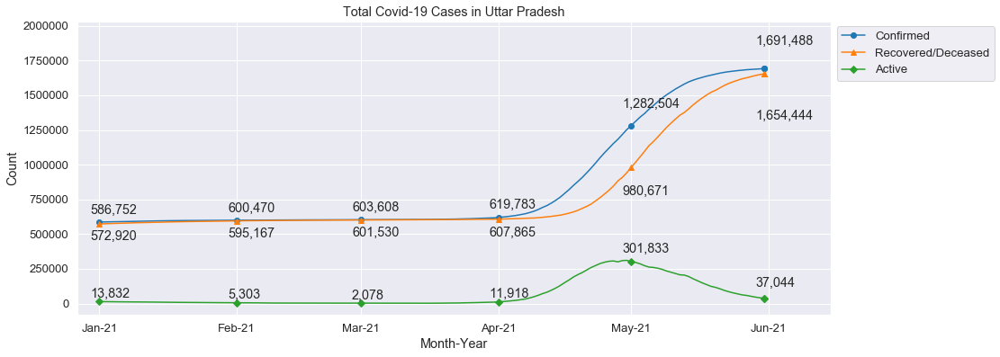

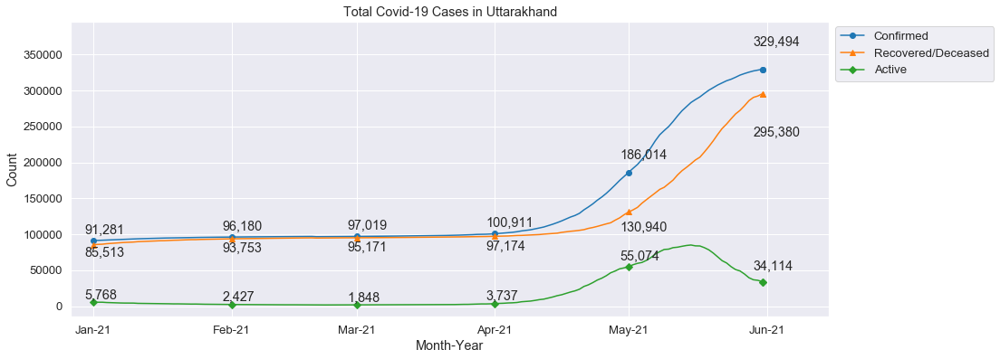

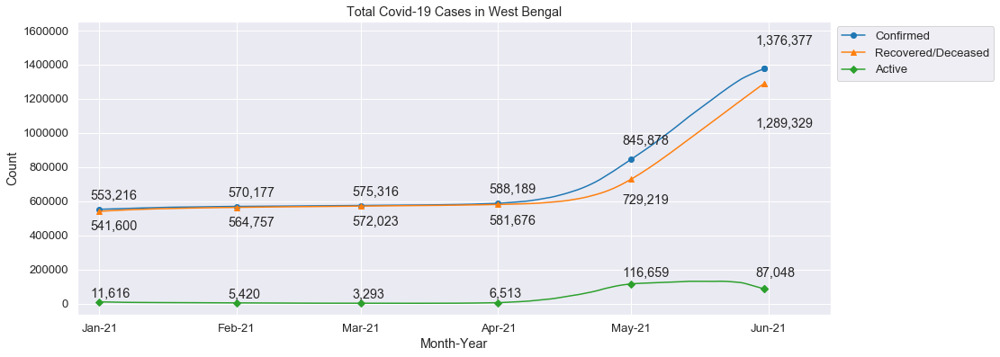

In [14]:
## Plotting time-series of Confirmed, Recovered/Deceased and Active cases for every State and UT
for state_name in states:
    plot_conf_rec_act(state_name)

## b. Top 3 states with the highest number of Active cases at any point of time

In [15]:
## Loading a copy of original data and subsetting data for choosen time period
state_df = cases.copy()
#state_df = state_df[(state_df['Date']>=start_date) & (state_df['Date']<=end_date)]
state_df['Year-Mon'] = state_df.Date.dt.strftime("%Y-%m")
state_df.head()

,Date,State,Confirmed,Recovered,Deceased,Active,Recovered/Deceased,Year-Mon
0,2020-01-30,Kerala,1,0,0,1,0,2020-01
1,2020-01-30,India,1,0,0,1,0,2020-01
2,2020-02-02,Kerala,2,0,0,2,0,2020-02
3,2020-02-02,India,2,0,0,2,0,2020-02
4,2020-02-03,Kerala,3,0,0,3,0,2020-02


In [16]:
## Given this is a time-series data picking up the last observation of the month as the latest snapshots
state_df['max_date'] = state_df.groupby(['Year-Mon','State'])['Date'].transform('max')
grouped_df = state_df[state_df['Date']==state_df['max_date']]

## Calculaing percentages to identify the most critical states
grouped_df['dec_per'] = round(grouped_df['Deceased']/grouped_df['Confirmed']*100,2)
grouped_df['act_per'] = round(grouped_df['Active']/grouped_df['Confirmed']*100,2)
grouped_df['rec_per'] = round(grouped_df['Recovered']/grouped_df['Confirmed']*100,2)
grouped_df.head()

,Date,State,Confirmed,Recovered,Deceased,Active,Recovered/Deceased,Year-Mon,max_date,dec_per,act_per,rec_per
0,2020-01-30,Kerala,1,0,0,1,0,2020-01,2020-01-30,0.0,100.0,0.0
1,2020-01-30,India,1,0,0,1,0,2020-01,2020-01-30,0.0,100.0,0.0
6,2020-02-14,Kerala,3,3,0,0,3,2020-02,2020-02-14,0.0,0.0,100.0
7,2020-02-14,India,3,3,0,0,3,2020-02,2020-02-14,0.0,0.0,100.0
517,2020-03-31,Andaman and Nicobar Islands,10,0,0,10,0,2020-03,2020-03-31,0.0,100.0,0.0


In [17]:
## Subset for active cases and states only
states_only_grouped_df = grouped_df[grouped_df['State']!='India']
active_grouped_df = states_only_grouped_df[['Year-Mon','State','Active','act_per']]
active_grouped_df.head()

,Year-Mon,State,Active,act_per
0,2020-01,Kerala,1,100.00
6,2020-02,Kerala,0,0.00
517,2020-03,Andaman and Nicobar Islands,10,100.00
518,2020-03,Andhra Pradesh,43,97.73
519,2020-03,Assam,1,100.00


In [18]:
## Defining a function that returns the highest 3 values along with their indices 
## It will be used to find Top 3 states with the highest percent of active cases for each Month-Year time period

def max_finder(ser):
    
    ## Creating a blank dataframe where observatons will be appended
    temp_df = pd.DataFrame(columns=['nth_largest','value','indexes'])
    
    ## Find Top 3 values along with their indices and append to above dataframe
    try:
        nth_largest = 1
        value = ser.max()
        indexes = ', '.join(list(ser[ser==value].index))
        temp_df.loc[len(temp_df)] = [nth_largest,value,indexes]
    except:
        pass
    
    try:
        nth_largest = 2
        value = sorted(ser.unique())[-2]
        indexes = ', '.join(list(ser[ser==value].index))
        temp_df.loc[len(temp_df)] = [nth_largest,value,indexes]
    except:
        pass

    try:
        nth_largest = 3
        value = sorted(ser.unique())[-3]
        indexes = ', '.join(list(ser[ser==value].index))
        temp_df.loc[len(temp_df)] = [nth_largest,value,indexes]
    except:
        pass
    
    ## Return dataframe with ranks, values and indices
    return temp_df

In [19]:
## Create an empty dataframe that will contain time-period (Month-Year), Top 3 states by active cases based on absolute numbers 
## and percentage values
summary_df = pd.DataFrame()

## Run the loop on a Time-period based Grouped object for individual states
for name, df in active_grouped_df.groupby('Year-Mon'):
    
    ## Set index as State so that our max_finder function that returns index of max values can provide state names
    df.set_index('State',inplace=True)
    
    ## Add suffix distinguishing top 3 by absolute numbers and percent values and concat them with their resp. time-period
    df_1 = max_finder(df['Active']).add_suffix('_by_cases')
    df_2 = max_finder(df['act_per']).add_suffix('_by_percent')
    final_df = pd.concat([df_1,df_2],axis=1)
    final_df['Year-Mon'] = name
    
    ## Append observations for each individual time period to summary dataframe
    summary_df = summary_df.append(final_df)
    
## Check the final dataframe
summary_df.head()

,nth_largest_by_cases,value_by_cases,indexes_by_cases,nth_largest_by_percent,value_by_percent,indexes_by_percent,Year-Mon
0,1,1,Kerala,1,100.00,Kerala,2020-01
0,1,0,Kerala,1,0.00,Kerala,2020-02
0,1,252,Maharashtra,1,100.00,"Andaman and Nicobar Islands, Assam, Chandigarh...",2020-03
1,2,215,Kerala,2,97.73,Andhra Pradesh,2020-03
2,3,117,Tamil Nadu,3,96.77,Rajasthan,2020-03


In [20]:
## Creating summary columns for both absolute numbers and percent values
summary_df['active_cases'] = summary_df['indexes_by_cases'].apply(str) + ' : ' + summary_df['value_by_cases'].apply(str)
summary_df['active_percent'] = summary_df['indexes_by_percent'].apply(str) + ' : ' + summary_df['value_by_percent'].apply(str) + '%'
summary_df.head()

,nth_largest_by_cases,value_by_cases,indexes_by_cases,nth_largest_by_percent,value_by_percent,indexes_by_percent,Year-Mon,active_cases,active_percent
0,1,1,Kerala,1,100.00,Kerala,2020-01,Kerala : 1,Kerala : 100.0%
0,1,0,Kerala,1,0.00,Kerala,2020-02,Kerala : 0,Kerala : 0.0%
0,1,252,Maharashtra,1,100.00,"Andaman and Nicobar Islands, Assam, Chandigarh...",2020-03,Maharashtra : 252,"Andaman and Nicobar Islands, Assam, Chandigarh..."
1,2,215,Kerala,2,97.73,Andhra Pradesh,2020-03,Kerala : 215,Andhra Pradesh : 97.73%
2,3,117,Tamil Nadu,3,96.77,Rajasthan,2020-03,Tamil Nadu : 117,Rajasthan : 96.77%


In [21]:
## Picking final columns, pivoting to bring to required format and changing names
active_cases_top = summary_df[['Year-Mon', 'nth_largest_by_cases', 'active_cases']]
active_cases_top = active_cases_top.pivot_table(index=['Year-Mon'],columns='nth_largest_by_cases',values='active_cases',aggfunc='first')
active_cases_top.columns.name = None
active_cases_top.index.name = None
active_cases_top = active_cases_top.add_prefix('No_').add_suffix('_by_cases')
active_cases_top.head()

,No_1_by_cases,No_2_by_cases,No_3_by_cases
2020-01,Kerala : 1,NaN,NaN
2020-02,Kerala : 0,NaN,NaN
2020-03,Maharashtra : 252,Kerala : 215,Tamil Nadu : 117
2020-04,Maharashtra : 8266,Gujarat : 3568,Delhi : 2362
2020-05,Maharashtra : 36040,Delhi : 10893,Tamil Nadu : 9400


In [22]:
## Picking final columns, pivoting to bring to required format and changing names
active_percent_top = summary_df[['Year-Mon', 'nth_largest_by_percent', 'active_percent']]
active_percent_top = active_percent_top.pivot_table(index=['Year-Mon'],columns='nth_largest_by_percent',values='active_percent',aggfunc='first')
active_percent_top.columns.name = None
active_percent_top.index.name = None
active_percent_top = active_percent_top.add_prefix('No_').add_suffix('_by_percent')
active_percent_top.head()

,No_1_by_percent,No_2_by_percent,No_3_by_percent
2020-01,Kerala : 100.0%,NaN,NaN
2020-02,Kerala : 0.0%,NaN,NaN
2020-03,"Andaman and Nicobar Islands, Assam, Chandigarh...",Andhra Pradesh : 97.73%,Rajasthan : 96.77%
2020-04,Mizoram : 100.0%,Meghalaya : 91.67%,Gujarat : 81.18%
2020-05,"Nagaland, Sikkim : 100.0%",Uttarakhand : 88.2%,Assam : 85.82%


### Visualizations

In [23]:
## Displaying top 3 states at every point of time based on absolute numbers of active cases
fig = go.Figure(data=[go.Table(header=dict(values=['Year-Mon']+list(active_cases_top.columns), align='left'),
                 cells=dict(values=[active_cases_top.index, active_cases_top.iloc[:,0], active_cases_top.iloc[:,1], active_cases_top.iloc[:,2]],
                           align='left'))
                     ])
fig.update_layout(height=len(active_cases_top)*30, margin=dict(r=20, l=3, t=5, b=0))
fig.show()

In [24]:
## Displaying top 3 states at every point of time based on percent values of active cases
fig = go.Figure(data=[go.Table(header=dict(values=['Year-Mon']+list(active_percent_top.columns), align='left'),
                 cells=dict(values=[active_percent_top.index, active_percent_top.iloc[:,0], active_percent_top.iloc[:,1], active_percent_top.iloc[:,2]],
                           align='left'))
                     ])
fig.update_layout(height=len(active_cases_top)*30, margin=dict(r=20, l=3, t=3, b=0))
fig.show()

## c. Trend of Recovered and Death Percentage over time

In [25]:
## Subset for Recovered and Deceased case columns only
data_india = grouped_df[grouped_df['State']=='India'][['Year-Mon','dec_per','rec_per']]
data_india.head()

,Year-Mon,dec_per,rec_per
1,2020-01,0.00,0.00
7,2020-02,0.00,100.00
543,2020-03,2.87,9.79
1562,2020-04,3.31,25.98
2687,2020-05,2.84,48.18


In [26]:
## Define a function to plot trend of Recovered and Death Percentages over time
def dec_rec_plotter(state):
    
    ## Filter for State and required columns
    data = grouped_df[grouped_df['State']==state][['Year-Mon','dec_per','rec_per']]
    
    ## Creating plots
    fig, ax = plt.subplots(1,2,figsize=(15,3))

    ## Bar plot for Deceased cases for individual states along with a line plot showing national average
    ax[0].plot(data_india['Year-Mon'],data_india['dec_per'],color=colors[3],linewidth=2,label='India')
    ax[0].bar(data['Year-Mon'],data['dec_per'],color=colors[0],width=0.5)
    ax[0].legend(loc=1,facecolor='White')
    
    ## Formatting ticks and adding labels
    ax[0].tick_params(rotation=90)
    ax[0].set_xlabel('Year-Mon',labelpad=25)
    ax[0].set_ylabel('Percent',labelpad=15)
    ax[0].set_title('Trend of Deceased People over Time')

    ## Bar plots for Recovered cases for individual states along with a line plot showing national average
    ax[1].plot(data_india['Year-Mon'],data_india['rec_per'],color=colors[4],linewidth=2,label='India')
    ax[1].bar(data['Year-Mon'],data['rec_per'],color=colors[1])
    ax[1].legend(loc=1,facecolor='White')
    
    ## Formatting ticks and adding labels
    ax[1].tick_params(rotation=90)
    ax[1].set_xlabel('Year-Mon',labelpad=25)
    ax[1].set_ylabel('Percent',labelpad=15)
    ax[1].set_title('Trend of Recovered People over Time')
    ax[1].set_ylim(top=120)

    ## Adding figure title
    fig.suptitle('Percent wise trend of Deceased and Recovered cases over time in '+state+' compared to India',y=1.2,fontsize=20)
    plt.show()

### Visualizations

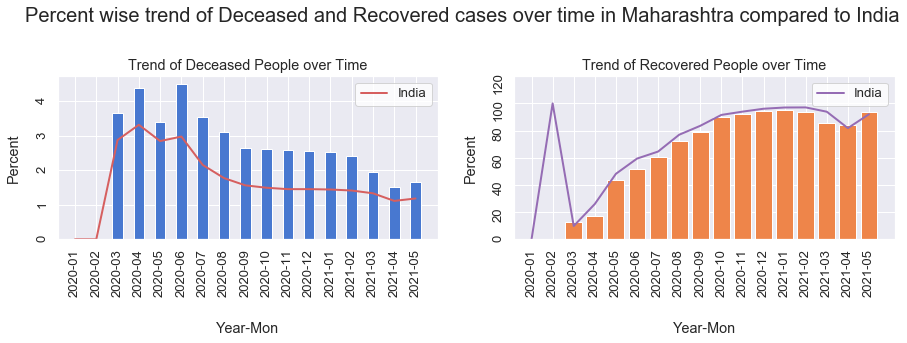

In [27]:
## As a sample, test case numbers for Maharashtra and comparing them to National Average over time
dec_rec_plotter('Maharashtra')

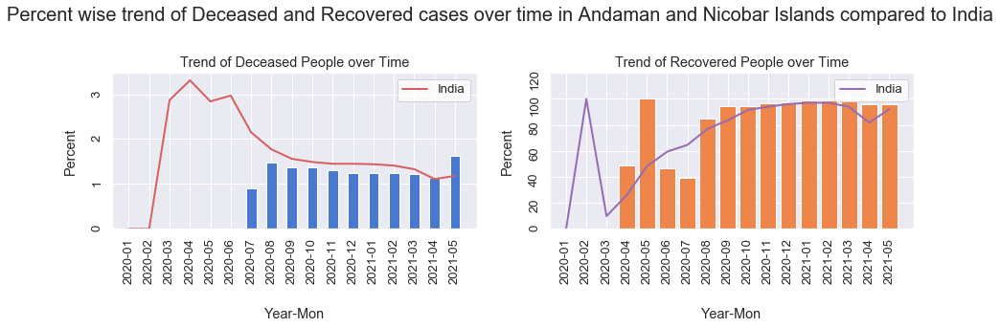

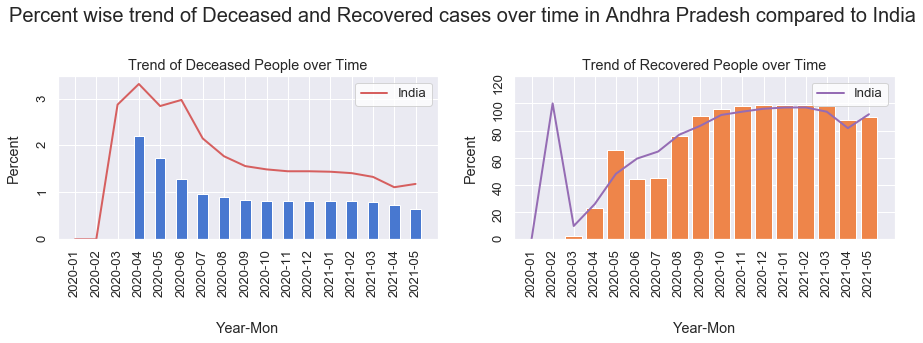

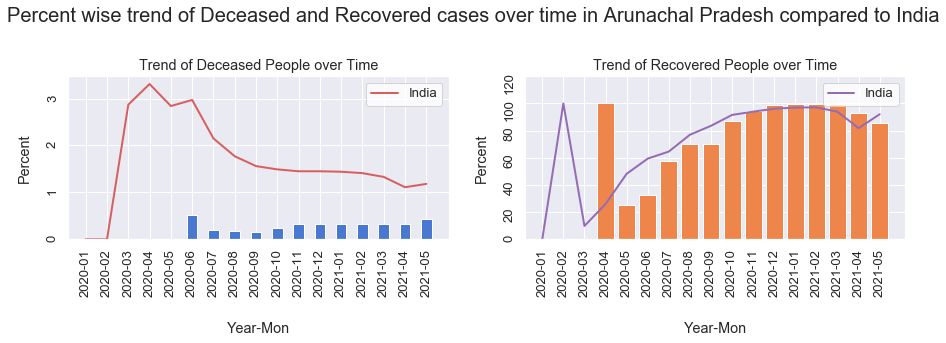

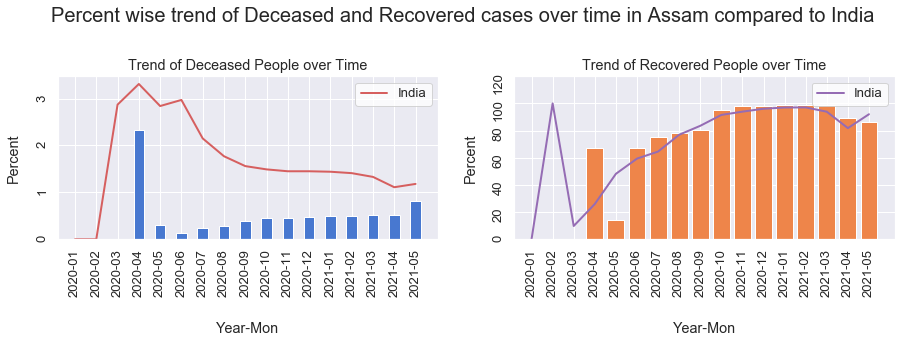

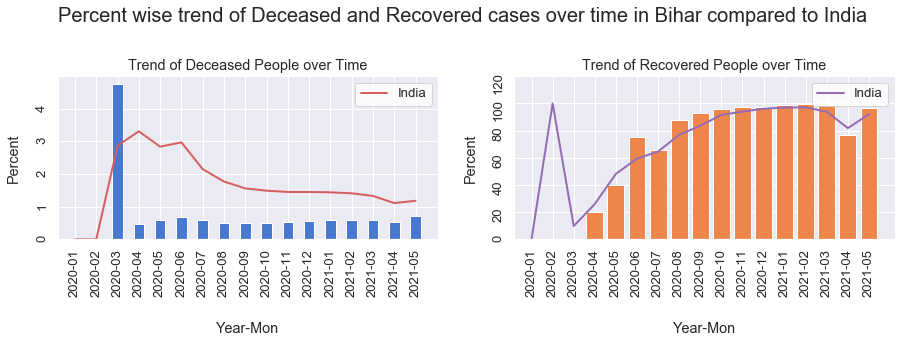

...

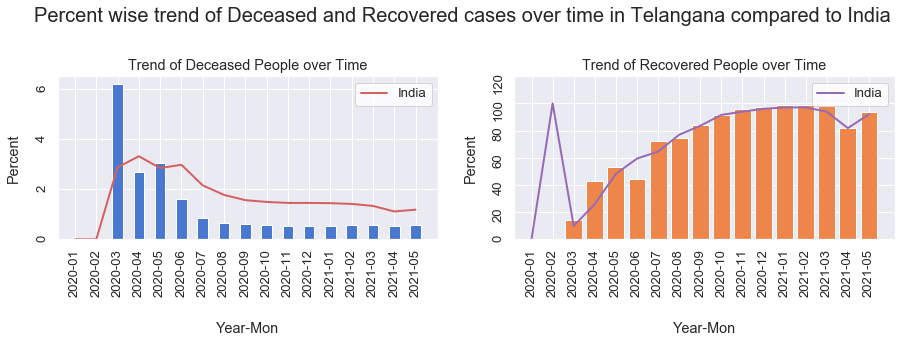

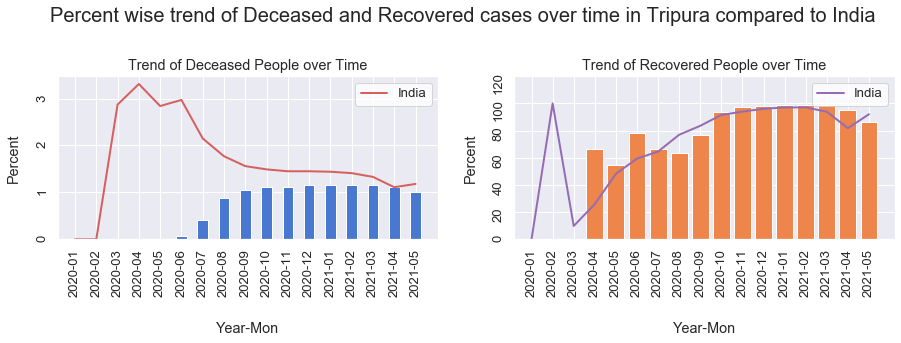

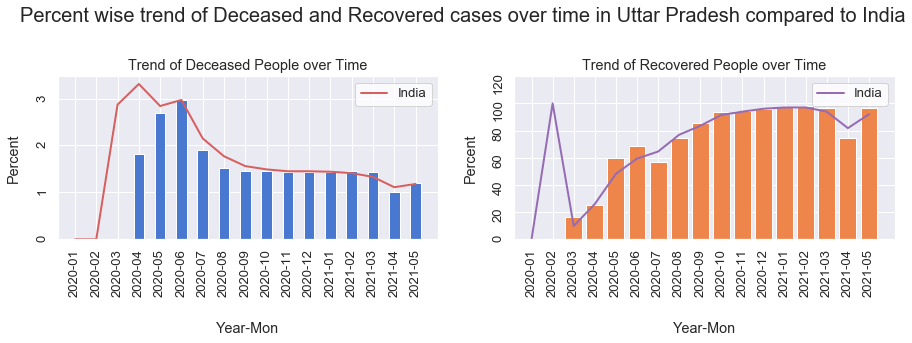

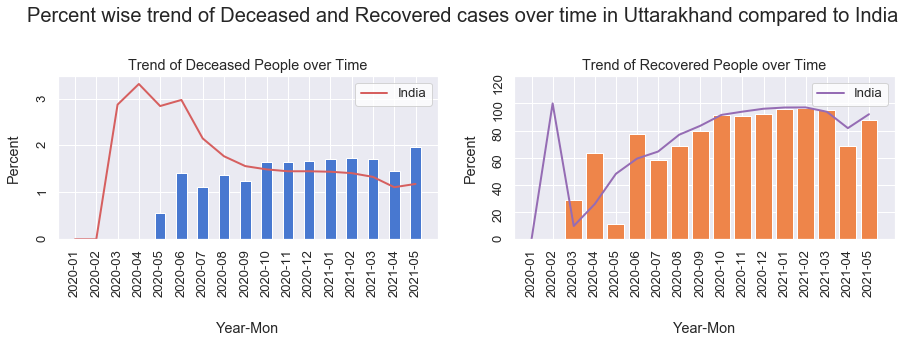

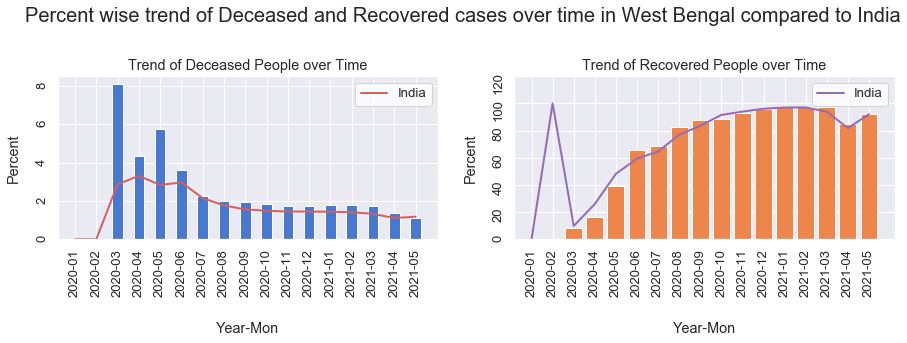

In [28]:
## Plotting trend of Recovered and Death Percentages over time for every State and UT
for state in states:
    print('\n')
    dec_rec_plotter(state)

# 2. Covid Vaccinations Data

## Data Exporation

In [29]:
## Read the vaccinations data from Covid API
vac = pd.read_csv("http://api.covid19india.org/csv/latest/cowin_vaccine_data_statewise.csv")
vac.head()

,Updated On,State,Total Individuals Vaccinated,Total Sessions Conducted,Total Sites,First Dose Administered,Second Dose Administered,Male(Individuals Vaccinated),Female(Individuals Vaccinated),Transgender(Individuals Vaccinated),Total Covaxin Administered,Total CoviShield Administered,Total Sputnik V Administered,AEFI,18-45 years (Age),45-60 years (Age),60+ years (Age),Total Doses Administered
0,16/01/2021,India,48276.0,3455.0,2957.0,48276.0,0.0,23757.0,24517.0,2.0,579.0,47697.0,NaN,NaN,NaN,NaN,NaN,48276.0
1,17/01/2021,India,58604.0,8532.0,4954.0,58604.0,0.0,27348.0,31252.0,4.0,635.0,57969.0,NaN,NaN,NaN,NaN,NaN,58604.0
2,18/01/2021,India,99449.0,13611.0,6583.0,99449.0,0.0,41361.0,58083.0,5.0,1299.0,98150.0,NaN,NaN,NaN,NaN,NaN,99449.0
3,19/01/2021,India,195525.0,17855.0,7951.0,195525.0,0.0,81901.0,113613.0,11.0,3017.0,192508.0,NaN,NaN,NaN,NaN,NaN,195525.0
4,20/01/2021,India,251280.0,25472.0,10504.0,251280.0,0.0,98111.0,153145.0,24.0,3946.0,247334.0,NaN,NaN,NaN,NaN,NaN,251280.0


In [30]:
## Keeping ony granular detail columns which can be used to generate aggrgated ones whenever needed
vac = vac[['Updated On', 'State', 'Total Covaxin Administered', 'Total CoviShield Administered', 
           'Total Sputnik V Administered', 'First Dose Administered', 'Second Dose Administered', 
           '18-45 years (Age)', '45-60 years (Age)', '60+ years (Age)']]
vac.head()

,Updated On,State,Total Covaxin Administered,Total CoviShield Administered,Total Sputnik V Administered,First Dose Administered,Second Dose Administered,18-45 years (Age),45-60 years (Age),60+ years (Age)
0,16/01/2021,India,579.0,47697.0,NaN,48276.0,0.0,NaN,NaN,NaN
1,17/01/2021,India,635.0,57969.0,NaN,58604.0,0.0,NaN,NaN,NaN
2,18/01/2021,India,1299.0,98150.0,NaN,99449.0,0.0,NaN,NaN,NaN
3,19/01/2021,India,3017.0,192508.0,NaN,195525.0,0.0,NaN,NaN,NaN
4,20/01/2021,India,3946.0,247334.0,NaN,251280.0,0.0,NaN,NaN,NaN


In [31]:
## Change type of Date column
vac['Updated On'] = pd.to_datetime(vac['Updated On'],format='%d/%m/%Y')
vac.dtypes

Updated On                       datetime64[ns]
State                                    object
Total Covaxin Administered              float64
Total CoviShield Administered           float64
Total Sputnik V Administered            float64
First Dose Administered                 float64
Second Dose Administered                float64
18-45 years (Age)                       float64
45-60 years (Age)                       float64
60+ years (Age)                         float64
dtype: object

In [32]:
## Drop rows with na threshold of 5 and check for NA values
vac.dropna(thresh=5,inplace=True)
vac.isna().sum()

Updated On                          0
State                               0
Total Covaxin Administered          0
Total CoviShield Administered       0
Total Sputnik V Administered     4624
First Dose Administered             0
Second Dose Administered            0
18-45 years (Age)                2184
45-60 years (Age)                2183
60+ years (Age)                  2183
dtype: int64

## Data Processing
##### Since provided data is a time series and we want to analyze the daily numbers, we need to nullify the cummulative values  

In [33]:
## Defining a function that takes a cumulative series and returns the original one
def nullify_cummulative(ser):
    
    ## The first element will remain the same in the original list as well
    orig = [ser[0]]
    
    ## For every subsequeent entry, substract the previous one to get original value and append it to original list
    for i in range(1,len(ser)):
        orig.append(ser[i]-ser[i-1])
        
    ## Return the original series
    return orig

In [34]:
## Creating an empty dataframe that will contain the original values (not cummulated) for all metrics 
mod_df = pd.DataFrame()

## Run the loop on a State based Grouped object and sort each of them by date inside the group
for name, df in vac.groupby('State',as_index=False):
    df.sort_values('Updated On',inplace=True)
    df.reset_index(drop=True,inplace=True)
    
    ## We'll fill inital null values of cumulative series with 0
    ## And if there are any null value amidst the cummulative series, we'll fill those by its previous observation
    for col in df.columns[2:]:
        df.loc[:df[col].first_valid_index()-1,col] = 0
        df[col].fillna(method='ffill',inplace=True)  
    
    ## Now, we don't have any null values thus we can perform our cummulative nullifying action
    orig_values = df.iloc[:,2:].apply(nullify_cummulative)
    orig_values = orig_values.applymap(int)

    ## Combine the numeric columns with Date and State to get the final modified dataframe
    vaccine_orig = pd.concat([df.iloc[:,:2],orig_values],axis=1)
    mod_df = mod_df.append(vaccine_orig)   

## Check the final modified dataframe
mod_df.reset_index(drop=True,inplace=True)
mod_df.head()

,Updated On,State,Total Covaxin Administered,Total CoviShield Administered,Total Sputnik V Administered,First Dose Administered,Second Dose Administered,18-45 years (Age),45-60 years (Age),60+ years (Age)
0,2021-01-16,Andaman and Nicobar Islands,0,23,0,23,0,0,0,0
1,2021-01-17,Andaman and Nicobar Islands,0,0,0,0,0,0,0,0
2,2021-01-18,Andaman and Nicobar Islands,0,19,0,19,0,0,0,0
3,2021-01-19,Andaman and Nicobar Islands,0,47,0,47,0,0,0,0
4,2021-01-20,Andaman and Nicobar Islands,0,35,0,35,0,0,0,0


In [35]:
## Check the modified dataframe for any null values
mod_df.isna().sum()

Updated On                       0
State                            0
Total Covaxin Administered       0
Total CoviShield Administered    0
Total Sputnik V Administered     0
First Dose Administered          0
Second Dose Administered         0
18-45 years (Age)                0
45-60 years (Age)                0
60+ years (Age)                  0
dtype: int64

## a. Daily Vaccination jabs by Drug Brands

In [36]:
## Define a function to plot daily vaccination jabs by Drug Brands
def daily_vaccination_plotter_by_drug_brand(state):
    
    ## Filter for State and find the most latest observation and print the summary numbers of vaccines administered till date 
    df = vac[vac['State']==state]
    last_entry = df[df['Updated On'] == df['Updated On'].max()]
    
    str_to_print = '        '+state+' as of '+last_entry['Updated On'].iloc[0].strftime("%d-%b-%Y")+': '+\
        ' CoviShield '+'{:,}'.format(int(last_entry['Total CoviShield Administered'].iloc[0]))+'; '+\
        ' Covaxin '+'{:,}'.format(int(last_entry['Total Covaxin Administered'].iloc[0]))+'; '+\
        ' Sputnik '+'{:,}'.format(int(last_entry['Total Sputnik V Administered'].iloc[0]))+'; '+\
        ' Total '+'{:,}'.format(int(last_entry['Total CoviShield Administered'].iloc[0] +\
                                     last_entry['Total Covaxin Administered'].iloc[0] +\
                                     last_entry['Total Sputnik V Administered'].iloc[0]))
    print(str_to_print.center(width))
    
    ## Filter for State and summarize daily numbers on weekly level
    state_df = mod_df[mod_df['State']==state]
    data = state_df.resample('W',on='Updated On').sum()
    data.reset_index(inplace=True)

    ## Creating plots
    fig, ax = plt.subplots(figsize=(15,5))

    ## Plots for Daily Administered Doses of CoviShield and Covaxin over time
    ax.bar(mdates.date2num(data['Updated On'])-0.75,data['Total CoviShield Administered'],label='Covishield',width=1.5)
    ax.bar(mdates.date2num(data['Updated On'])+0.75,data['Total Covaxin Administered'],label='Covaxin',width=1.5)
    plt.legend(loc=1,facecolor='White')

    ## Formatting X-axis for appropriate Date format, Major and Minor Ticks along with axis limits
    date_form = DateFormatter("%d-%b-%y")
    ax.xaxis.set_major_formatter(date_form)
    ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=1,byweekday=(6)))
    _, y_top = ax.get_ylim()
    ax.set_ylim(top=max(data['Total CoviShield Administered'])*1.25)
    
    ## Using a loop to plot text for all the points of each of the 2 bar lines
    for i in range(len(data)):
        ax.text(mdates.date2num(data['Updated On'].iloc[i])-1.3,  y_top/40 + data['Total CoviShield Administered'].iloc[i], '{:,}'.format(data['Total CoviShield Administered'].iloc[i]), rotation=90, size = 9)
        ax.text(mdates.date2num(data['Updated On'].iloc[i])+0.45, y_top/40 + data['Total Covaxin Administered'].iloc[i],       '{:,}'.format(data['Total Covaxin Administered'].iloc[i]),    rotation=90, size = 9)

    ## Adding labels
    fig.autofmt_xdate()
    plt.xlabel('Timeline',labelpad=10)
    plt.ylabel('Number of Vaccines',labelpad=10)
    plt.title('Daily Vaccinations by drug brand in '+state)
    plt.show()

        India as of 30-May-2021:  CoviShield 185,950,671;  Covaxin 22,948,962;  Sputnik 8,090;  Total 208,907,723


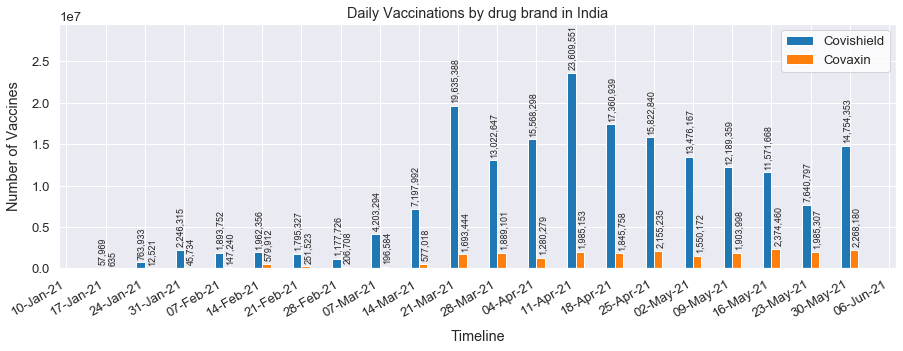

In [37]:
## Plotting daily vaccination jabs by Drug Brands for India as a whole
daily_vaccination_plotter_by_drug_brand('India')

        Andaman and Nicobar Islands as of 30-May-2021:  CoviShield 123,725;  Covaxin 0;  Sputnik 0;  Total 123,725


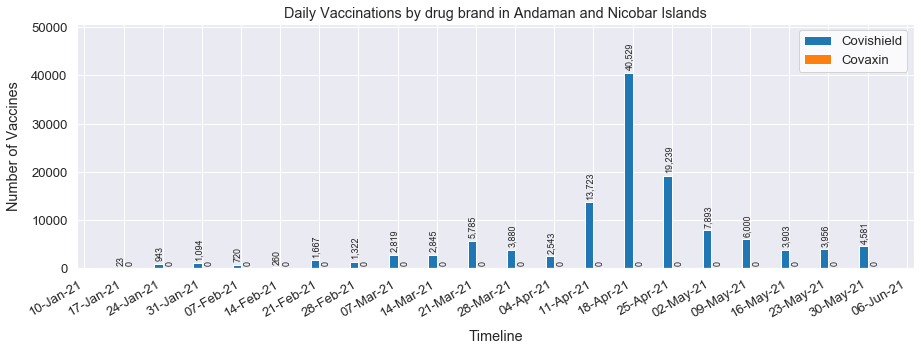

        Andhra Pradesh as of 30-May-2021:  CoviShield 8,063,722;  Covaxin 1,709,033;  Sputnik 169;  Total 9,772,924


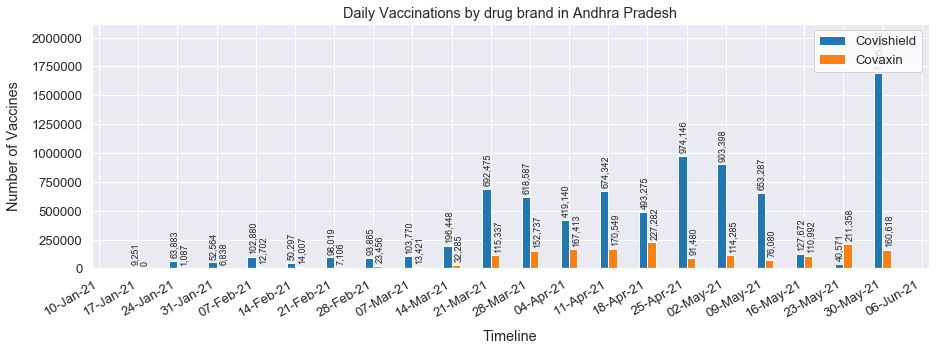

        Arunachal Pradesh as of 30-May-2021:  CoviShield 333,067;  Covaxin 0;  Sputnik 0;  Total 333,067


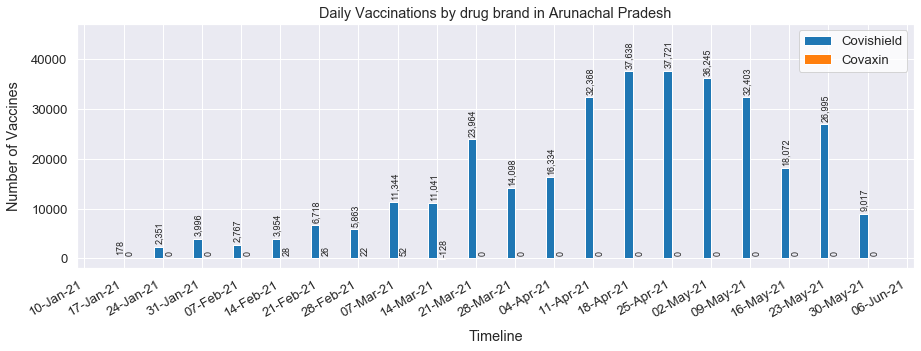

        Assam as of 30-May-2021:  CoviShield 3,269,869;  Covaxin 824,324;  Sputnik 0;  Total 4,094,193


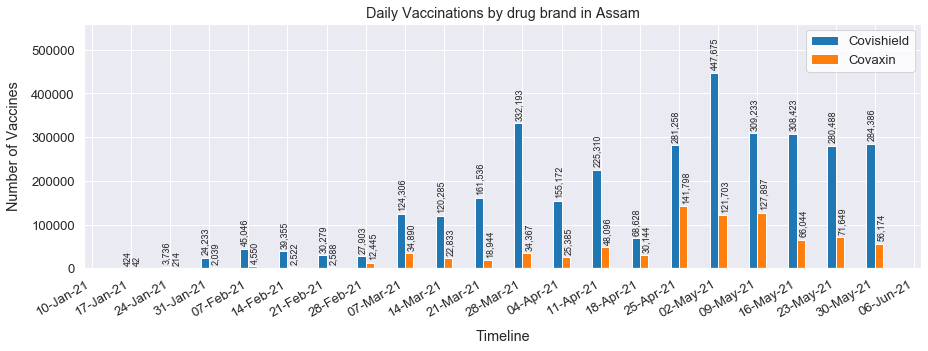

        Bihar as of 30-May-2021:  CoviShield 9,443,156;  Covaxin 804,259;  Sputnik 0;  Total 10,247,415


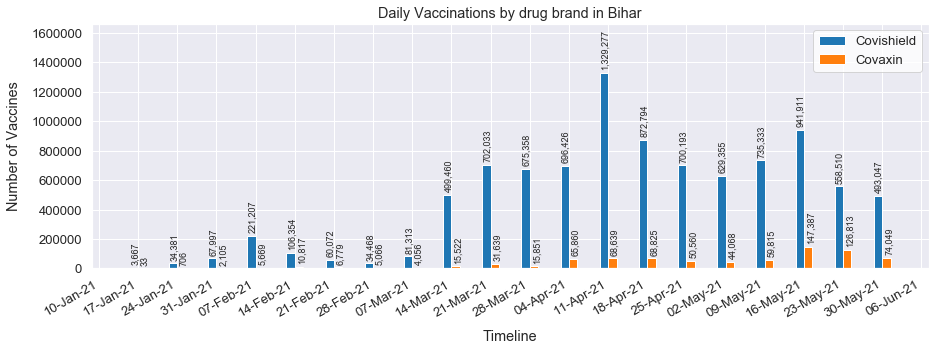

        Chandigarh as of 30-May-2021:  CoviShield 343,466;  Covaxin 0;  Sputnik 0;  Total 343,466


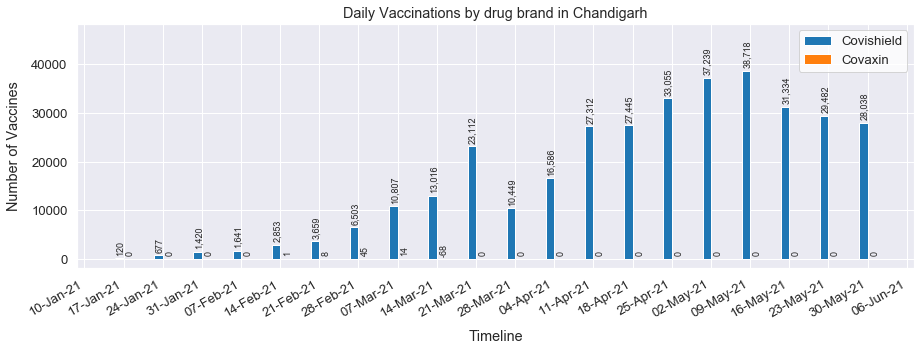

        Chhattisgarh as of 30-May-2021:  CoviShield 6,044,419;  Covaxin 189,047;  Sputnik 0;  Total 6,233,466


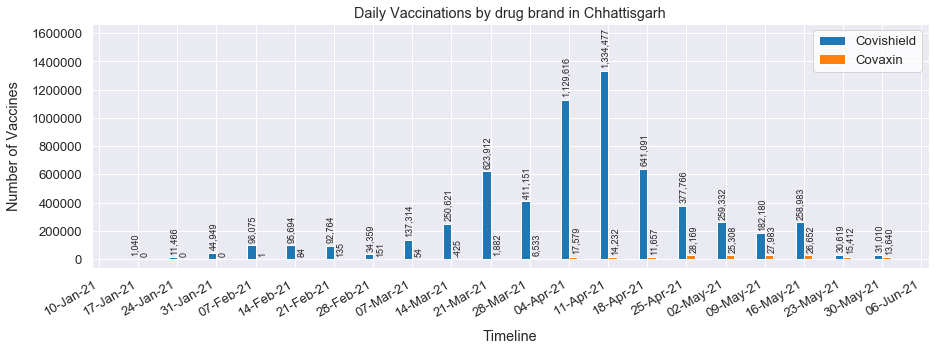

        Dadra and Nagar Haveli and Daman and Diu as of 30-May-2021:  CoviShield 189,815;  Covaxin 0;  Sputnik 0;  Total 189,815


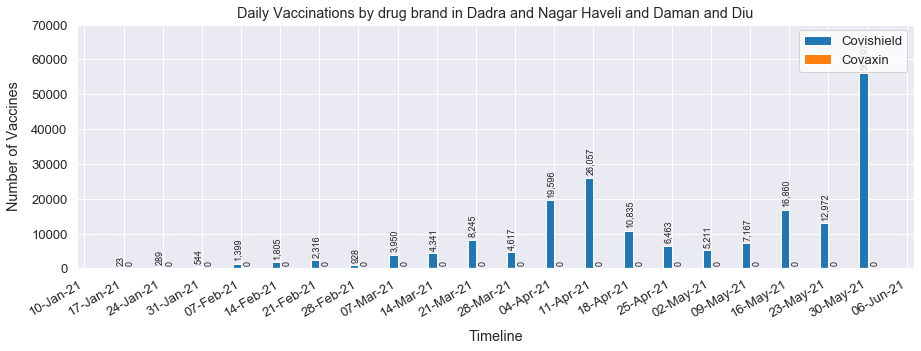

        Delhi as of 30-May-2021:  CoviShield 3,739,007;  Covaxin 1,623,097;  Sputnik 0;  Total 5,362,104


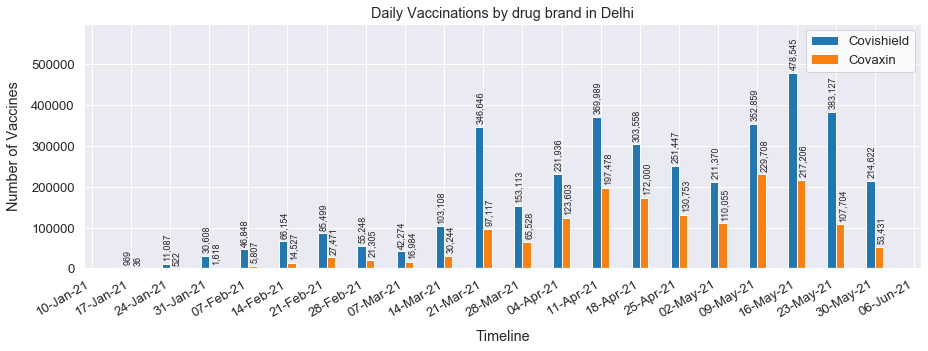

        Goa as of 30-May-2021:  CoviShield 517,743;  Covaxin 6,629;  Sputnik 0;  Total 524,372


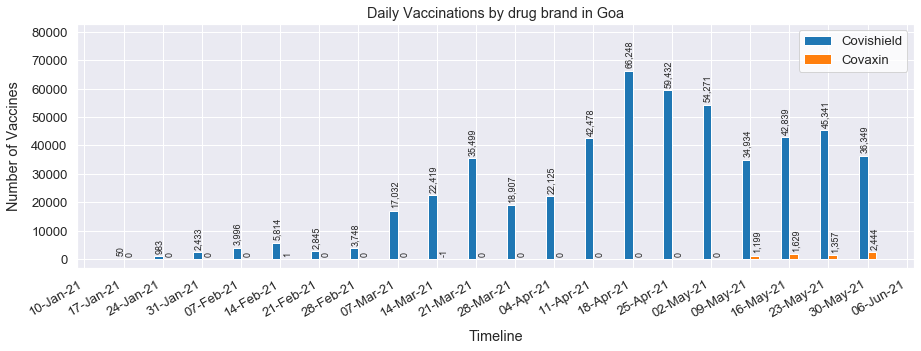

        Gujarat as of 30-May-2021:  CoviShield 14,912,244;  Covaxin 1,998,001;  Sputnik 0;  Total 16,910,245


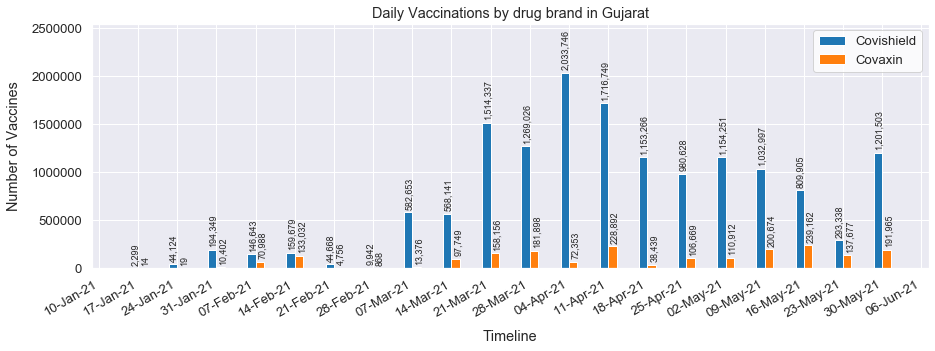

        Haryana as of 30-May-2021:  CoviShield 5,038,381;  Covaxin 793,947;  Sputnik 0;  Total 5,832,328


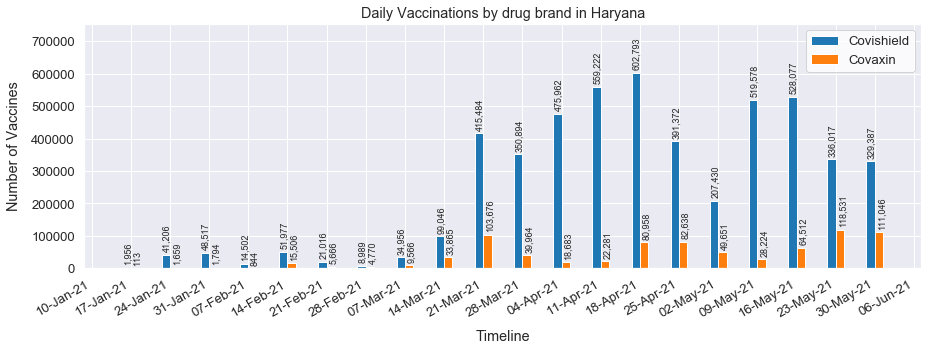

        Himachal Pradesh as of 30-May-2021:  CoviShield 2,431,191;  Covaxin 0;  Sputnik 0;  Total 2,431,191


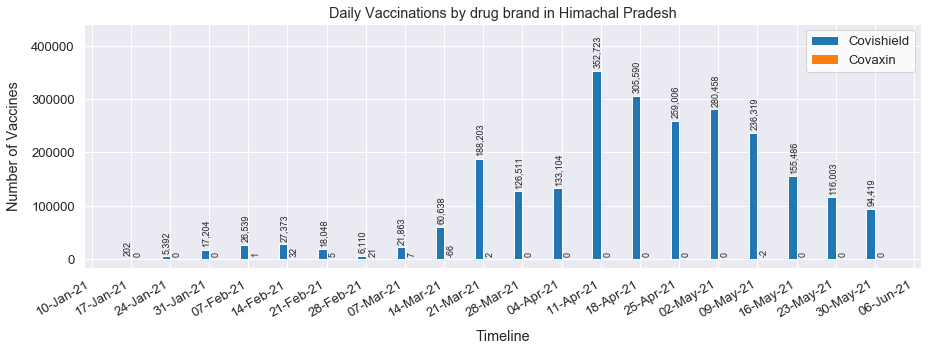

        Jammu and Kashmir as of 30-May-2021:  CoviShield 3,226,123;  Covaxin 39,319;  Sputnik 0;  Total 3,265,442


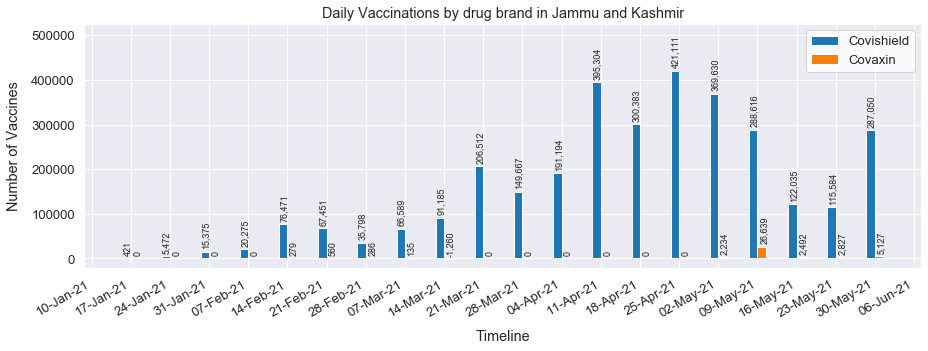

        Jharkhand as of 30-May-2021:  CoviShield 3,632,867;  Covaxin 523,909;  Sputnik 0;  Total 4,156,776


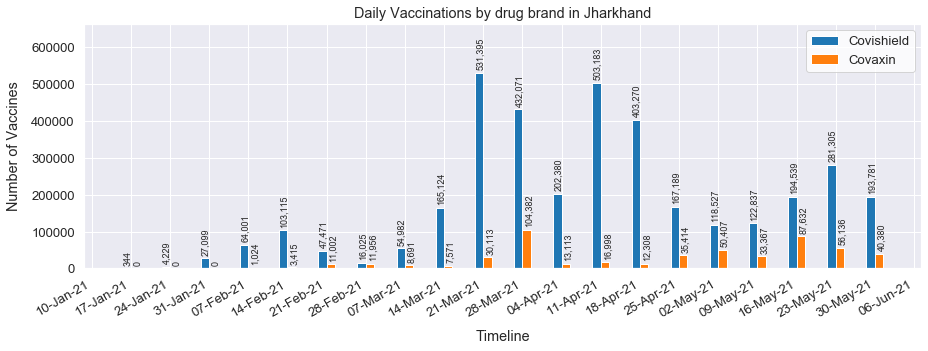

        Karnataka as of 30-May-2021:  CoviShield 12,006,941;  Covaxin 1,432,867;  Sputnik 0;  Total 13,439,808


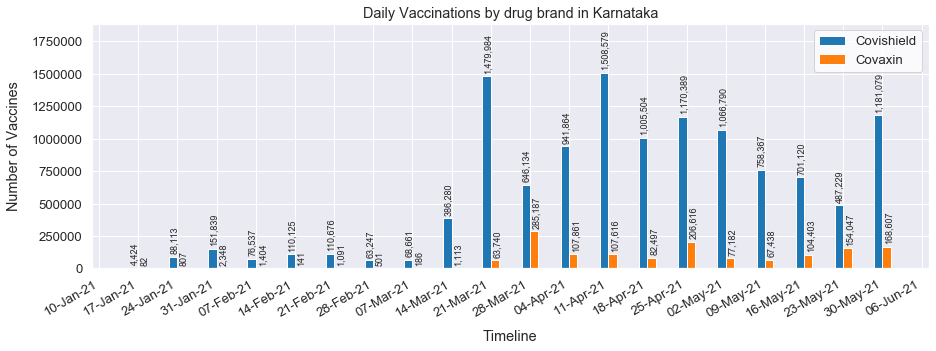

        Kerala as of 30-May-2021:  CoviShield 8,586,104;  Covaxin 655,352;  Sputnik 0;  Total 9,241,456


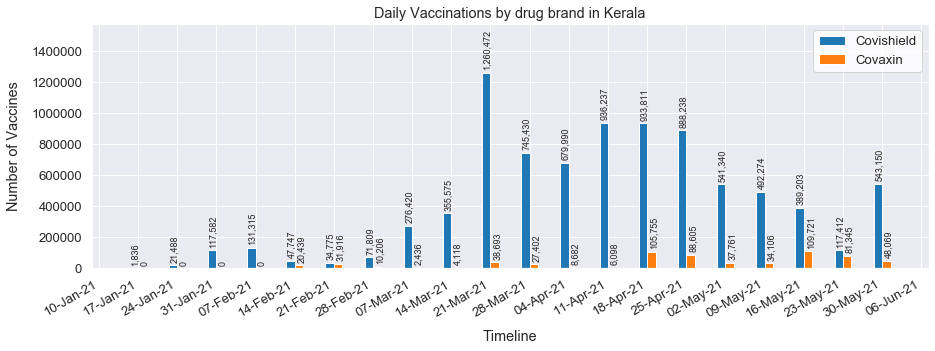

        Ladakh as of 30-May-2021:  CoviShield 154,135;  Covaxin 0;  Sputnik 0;  Total 154,135


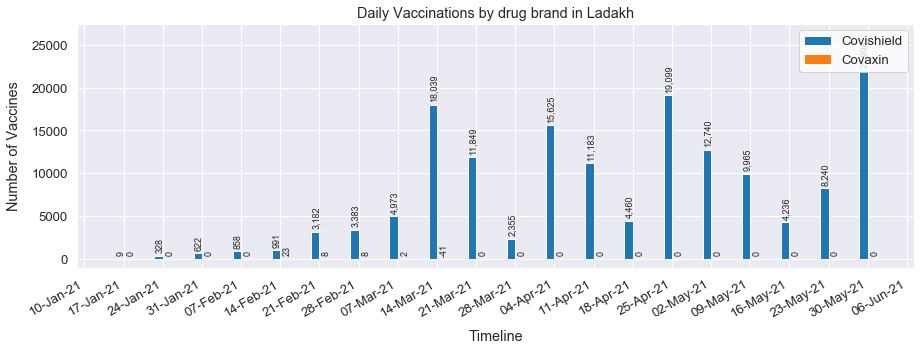

        Lakshadweep as of 30-May-2021:  CoviShield 32,818;  Covaxin 0;  Sputnik 0;  Total 32,818


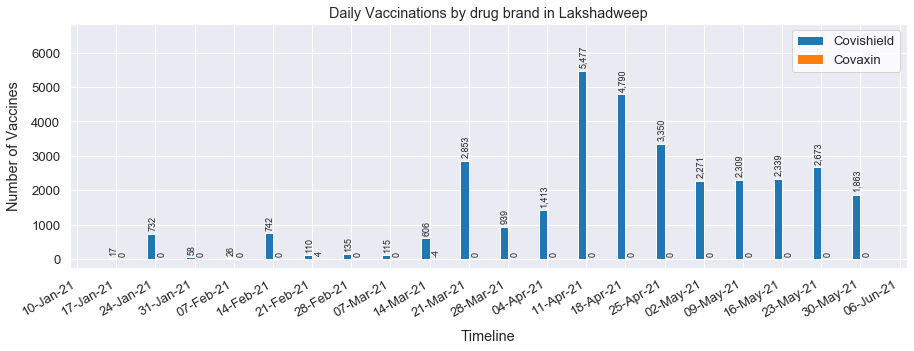

        Madhya Pradesh as of 30-May-2021:  CoviShield 9,771,139;  Covaxin 1,128,808;  Sputnik 0;  Total 10,899,947


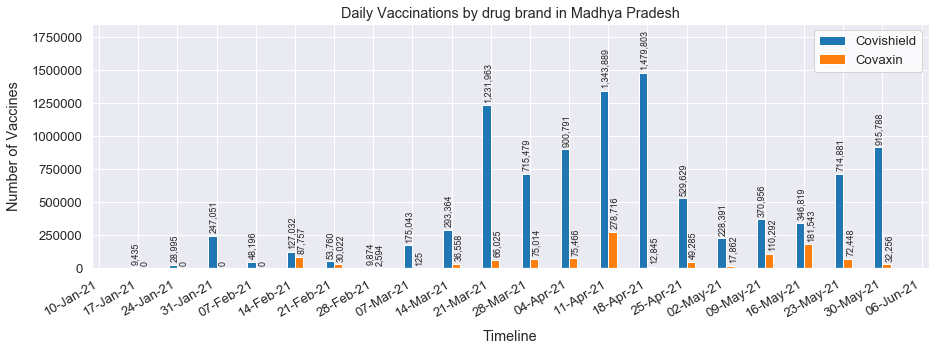

        Maharashtra as of 30-May-2021:  CoviShield 19,628,420;  Covaxin 2,691,236;  Sputnik 0;  Total 22,319,656


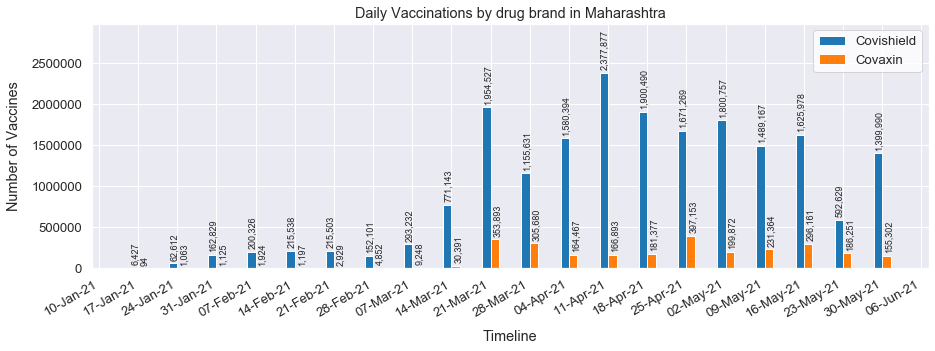

        Manipur as of 30-May-2021:  CoviShield 451,219;  Covaxin 0;  Sputnik 0;  Total 451,219


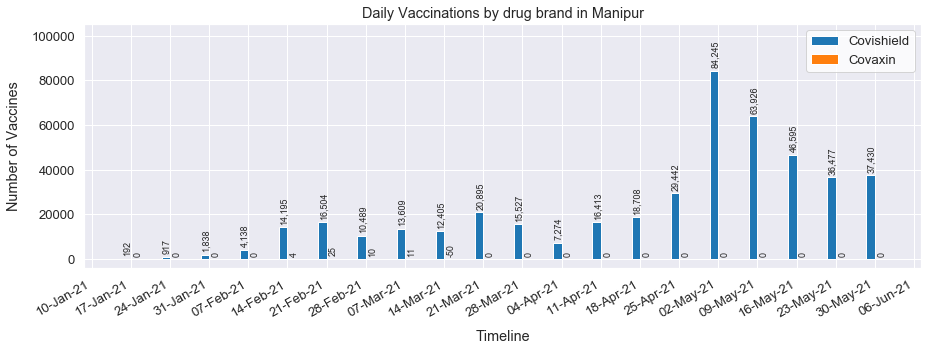

        Meghalaya as of 30-May-2021:  CoviShield 464,224;  Covaxin 0;  Sputnik 0;  Total 464,224


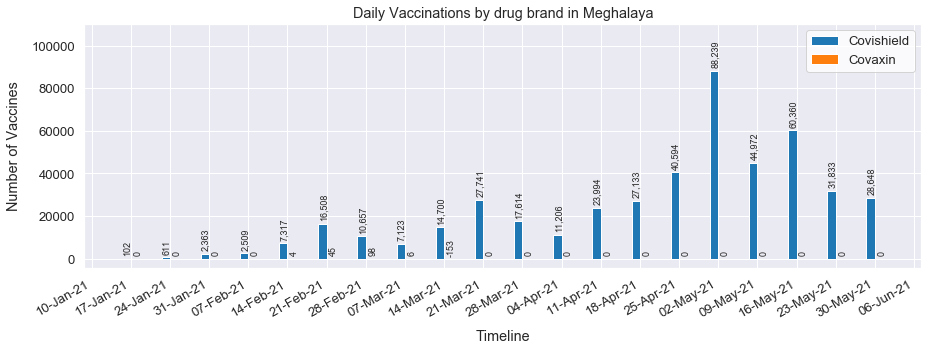

        Mizoram as of 30-May-2021:  CoviShield 313,453;  Covaxin 0;  Sputnik 0;  Total 313,453


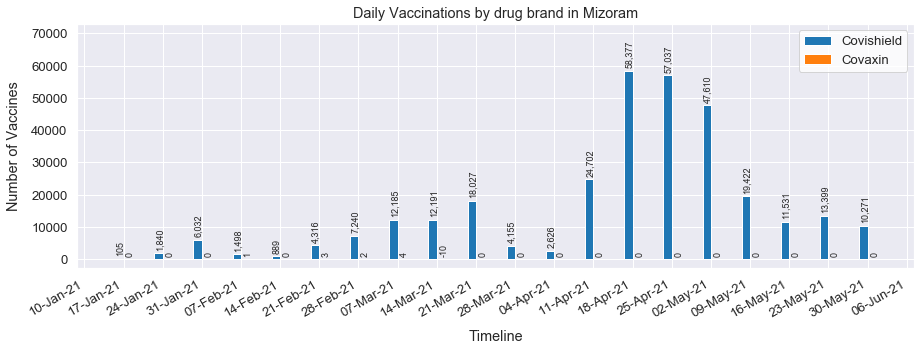

        Nagaland as of 30-May-2021:  CoviShield 262,571;  Covaxin 0;  Sputnik 0;  Total 262,571


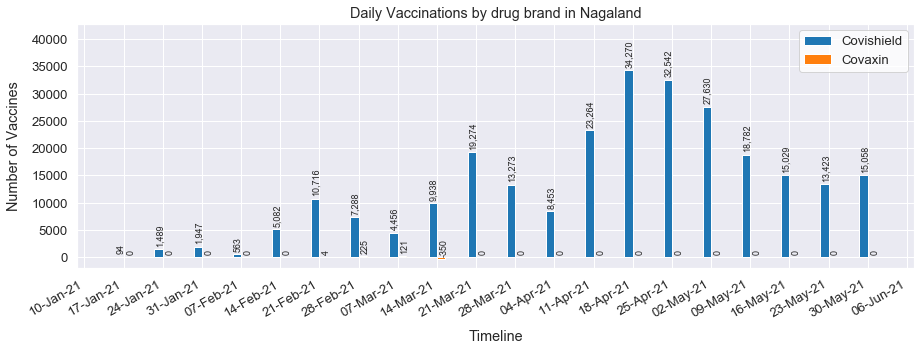

        Odisha as of 30-May-2021:  CoviShield 6,915,814;  Covaxin 812,156;  Sputnik 0;  Total 7,727,970


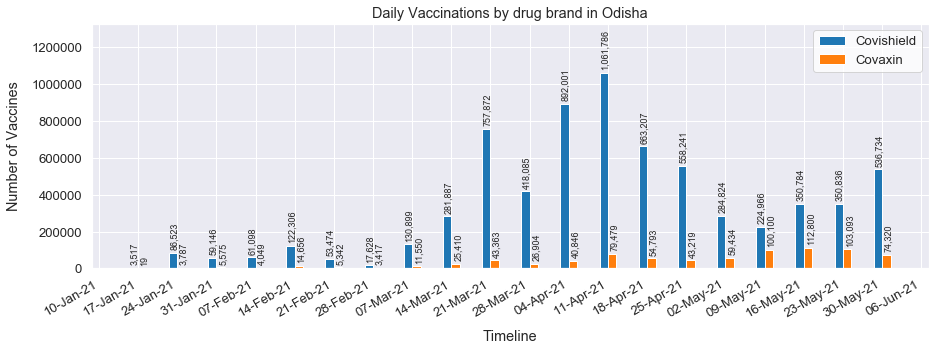

        Puducherry as of 30-May-2021:  CoviShield 265,694;  Covaxin 74;  Sputnik 0;  Total 265,768


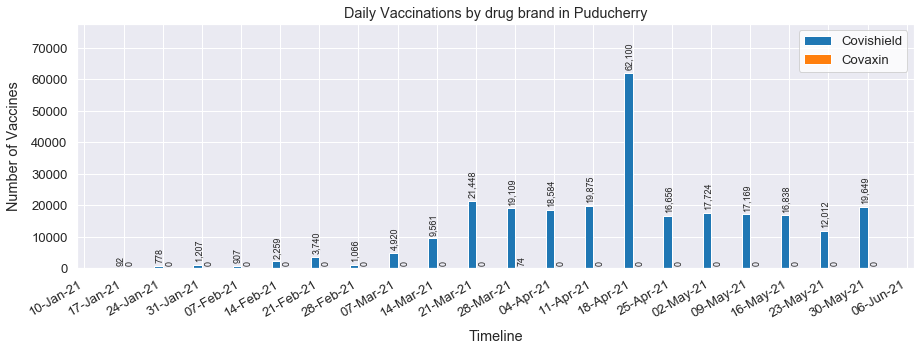

        Punjab as of 30-May-2021:  CoviShield 4,179,974;  Covaxin 422,617;  Sputnik 0;  Total 4,602,591


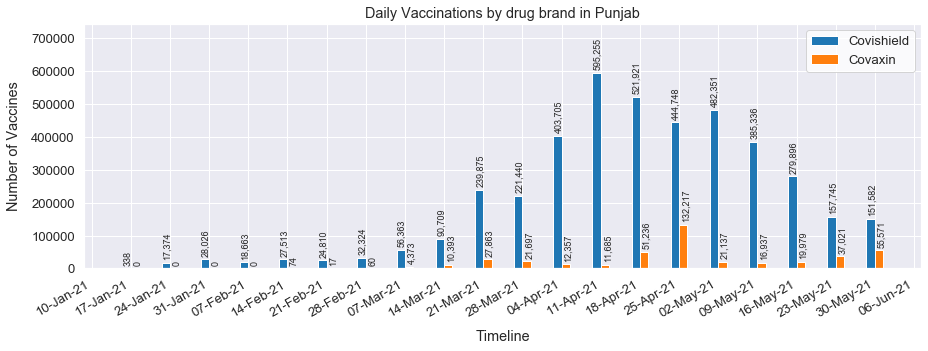

        Rajasthan as of 30-May-2021:  CoviShield 15,647,103;  Covaxin 1,218,555;  Sputnik 0;  Total 16,865,658


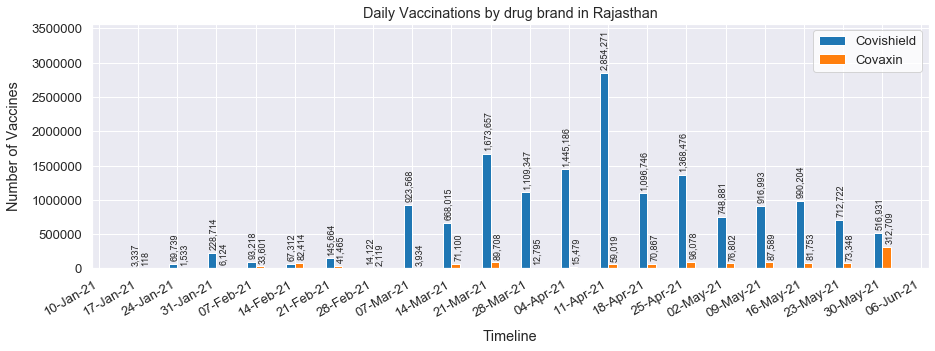

        Sikkim as of 30-May-2021:  CoviShield 238,891;  Covaxin 0;  Sputnik 0;  Total 238,891


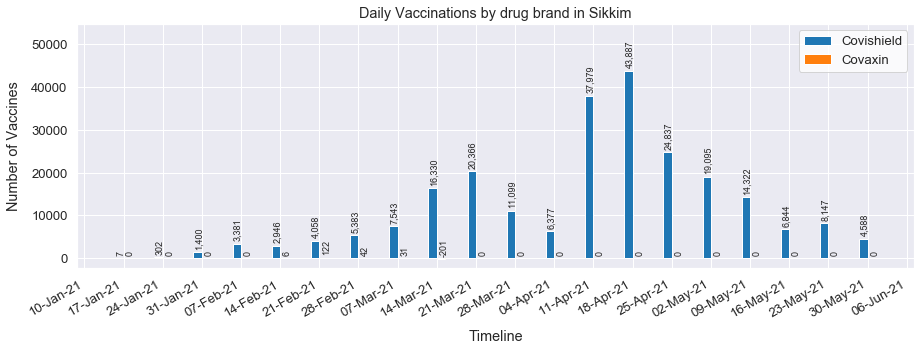

        Tamil Nadu as of 30-May-2021:  CoviShield 7,546,638;  Covaxin 1,347,360;  Sputnik 0;  Total 8,893,998


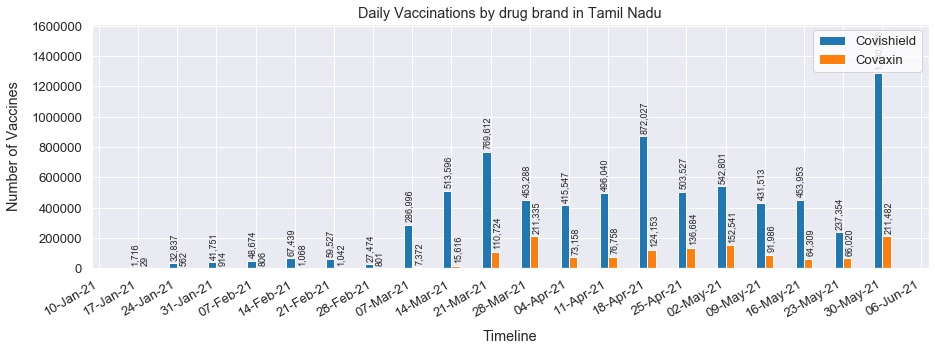

        Telangana as of 30-May-2021:  CoviShield 5,018,076;  Covaxin 959,463;  Sputnik 7,921;  Total 5,985,460


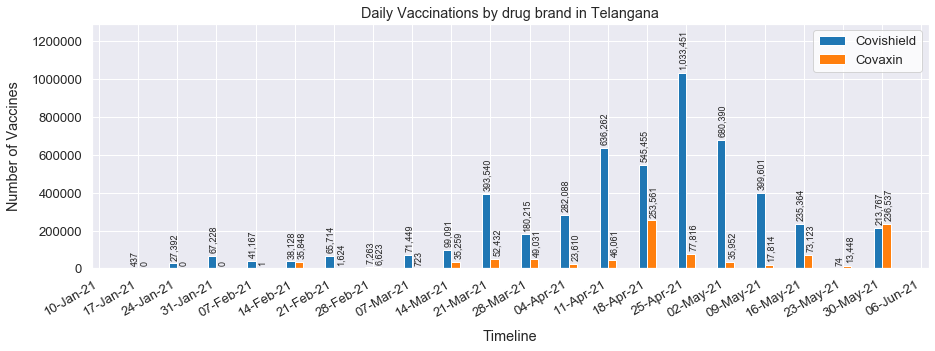

        Tripura as of 30-May-2021:  CoviShield 1,586,978;  Covaxin 15,099;  Sputnik 0;  Total 1,602,077


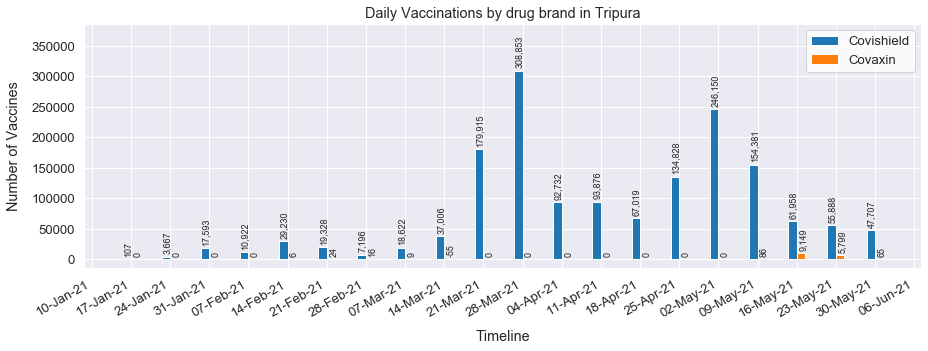

        Uttar Pradesh as of 30-May-2021:  CoviShield 15,955,378;  Covaxin 2,055,533;  Sputnik 0;  Total 18,010,911


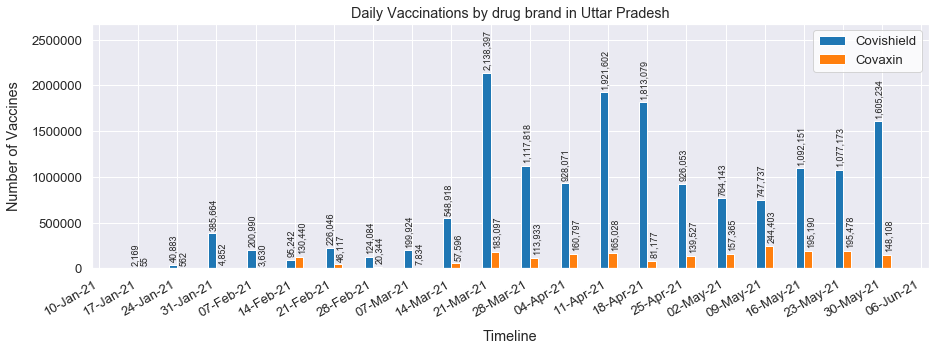

        Uttarakhand as of 30-May-2021:  CoviShield 2,829,171;  Covaxin 72,443;  Sputnik 0;  Total 2,901,614


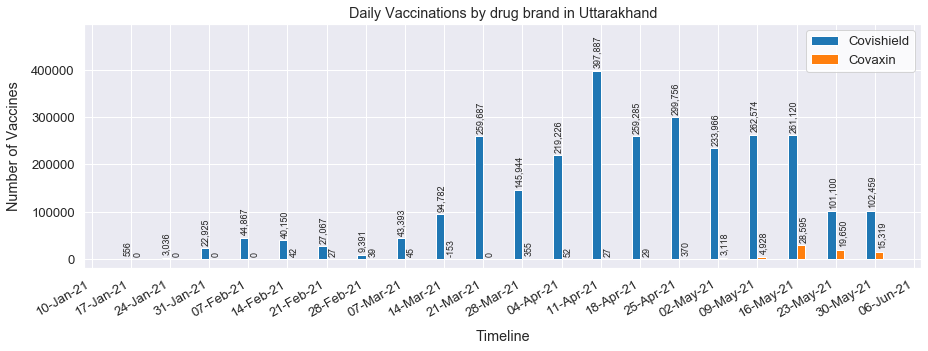

        West Bengal as of 30-May-2021:  CoviShield 12,787,135;  Covaxin 1,625,834;  Sputnik 0;  Total 14,412,969


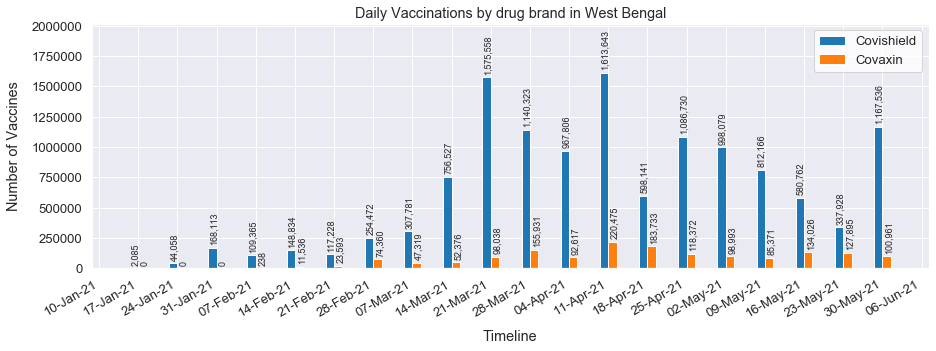

In [38]:
## Plotting daily vaccination jabs by Drug Brands for every State and UT
for state in states:
    daily_vaccination_plotter_by_drug_brand(state)

## b. Daily Vaccination jabs by Dose Number

In [39]:
## Define a function to plot daily vaccination jabs by Dose number
def daily_vaccination_plotter_by_dose_number(state):
    
    ## Filter for State and find the most latest observation and print the summary numbers of vaccines till date
    df = vac[vac['State']==state]
    last_entry = df[df['Updated On'] == df['Updated On'].max()]
    str_to_print = '       '+state+' as of '+last_entry['Updated On'].iloc[0].strftime("%d-%b-%Y")+': '+\
        ' First-Dose '+'{:,}'.format(int(last_entry['First Dose Administered'].iloc[0]))+'; '+\
        ' Second-Dose '+'{:,}'.format(int(last_entry['Second Dose Administered'].iloc[0]))+'; '+\
        ' Total Doses '+'{:,}'.format(int(last_entry['First Dose Administered'].iloc[0] +\
                                         last_entry['Second Dose Administered'].iloc[0]))
    print(str_to_print.center(width))
    
    ## Filter for State and summarize daily numbers on weekly level
    state_df = mod_df[mod_df['State']==state]
    data = state_df.resample('W',on='Updated On').sum()
    data.reset_index(inplace=True)
    
    ## Creating plots
    fig, ax = plt.subplots(figsize=(15,5))

    ## Plots for Daily Administered First and Second Doses over time
    ax.bar(mdates.date2num(data['Updated On'])-0.75,data['First Dose Administered'],label='First Dose',width=1.5)
    ax.bar(mdates.date2num(data['Updated On'])+0.75,data['Second Dose Administered'],label='Second Dose',width=1.5)
    plt.legend(loc=1,facecolor='White')

    ## Formatting X-axis for appropriate Date format, Major and Minor Ticks along with axis limits
    date_form = DateFormatter("%d-%b-%y")
    ax.xaxis.set_major_formatter(date_form)
    ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=1,byweekday=(6)))
    ax.set_ylim(top=max(data['First Dose Administered'])*1.25)
    _, y_top = ax.get_ylim()

    ## Using a loop to plot text for all the points of both the trend lines
    for i in range(len(data)):
        ax.text(mdates.date2num(data['Updated On'].iloc[i])-1.3,  y_top/40 + data['First Dose Administered'].iloc[i], '{:,}'.format(data['First Dose Administered'].iloc[i]), rotation=90, size = 9)
        ax.text(mdates.date2num(data['Updated On'].iloc[i])+0.45, y_top/40 + data['Second Dose Administered'].iloc[i],   '{:,}'.format(data['Second Dose Administered'].iloc[i]),    rotation=90, size = 9)

    ## Adding labels
    fig.autofmt_xdate()
    plt.xlabel('Timeline',labelpad=10)
    plt.ylabel('Number of Vaccines',labelpad=10)
    plt.title('Daily Vaccinations by dose number in '+state)
    plt.show()

       India as of 30-May-2021:  First-Dose 165,823,004;  Second-Dose 43,084,719;  Total Doses 208,907,723


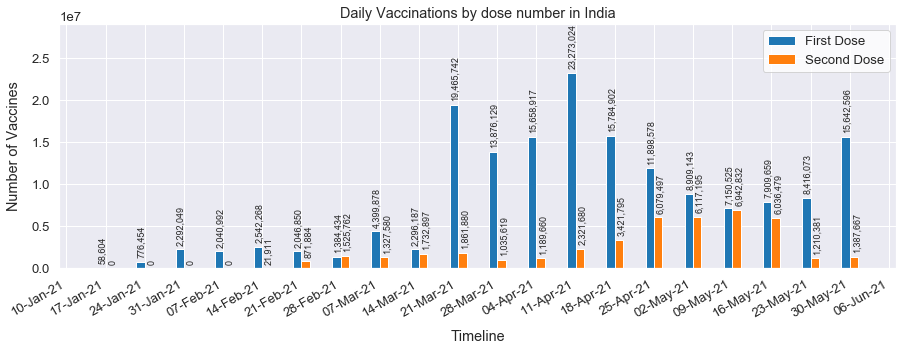

In [40]:
## Plotting daily vaccination jabs by Dose number for India as a whole
daily_vaccination_plotter_by_dose_number('India')

       Andaman and Nicobar Islands as of 30-May-2021:  First-Dose 108,559;  Second-Dose 15,166;  Total Doses 123,725


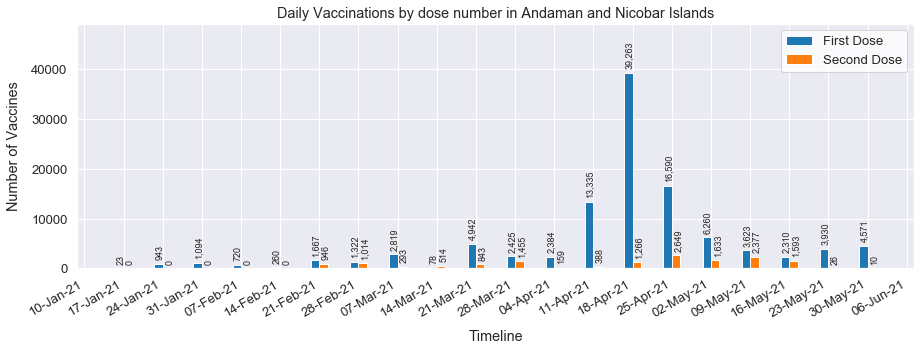

       Andhra Pradesh as of 30-May-2021:  First-Dose 7,288,465;  Second-Dose 2,484,459;  Total Doses 9,772,924


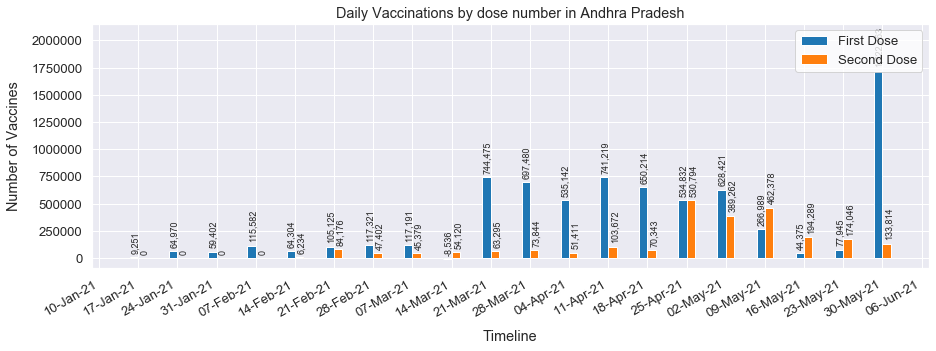

       Arunachal Pradesh as of 30-May-2021:  First-Dose 254,795;  Second-Dose 78,272;  Total Doses 333,067


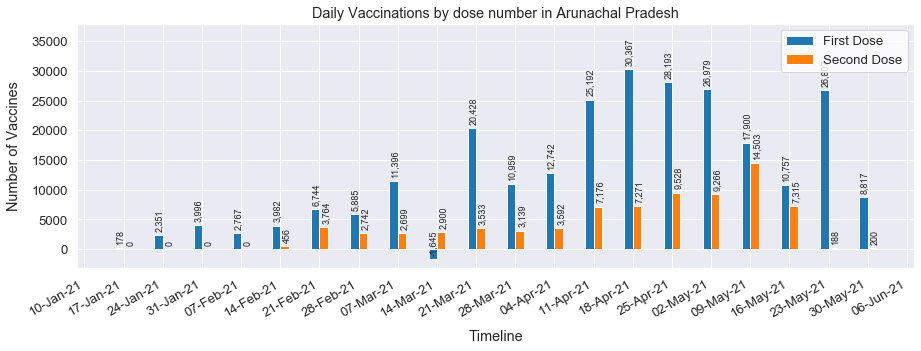

       Assam as of 30-May-2021:  First-Dose 3,265,432;  Second-Dose 828,761;  Total Doses 4,094,193


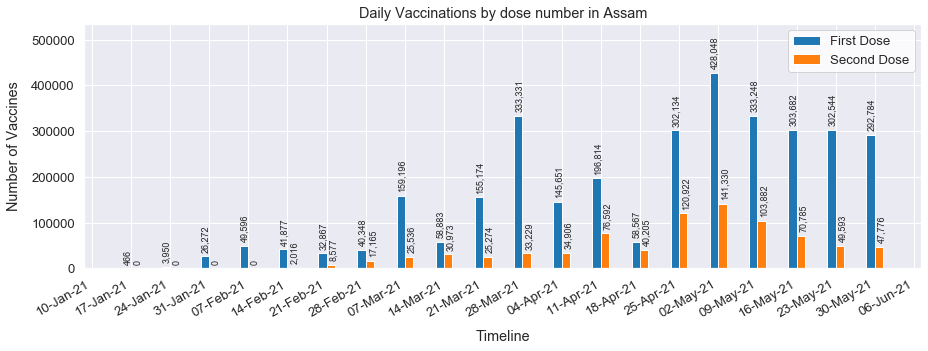

       Bihar as of 30-May-2021:  First-Dose 8,467,861;  Second-Dose 1,779,554;  Total Doses 10,247,415


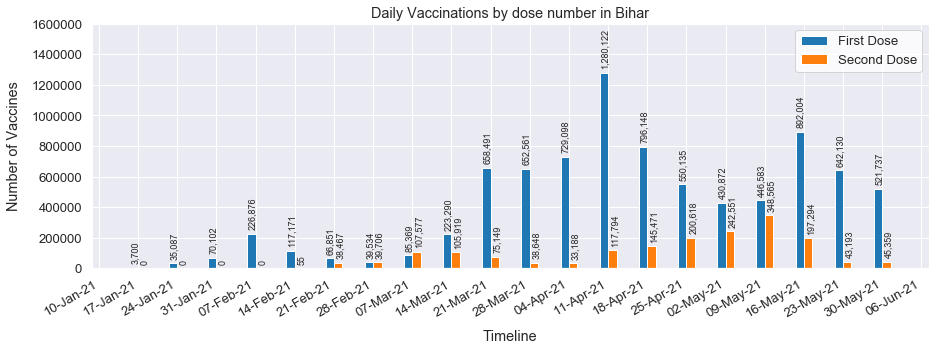

       Chandigarh as of 30-May-2021:  First-Dose 268,609;  Second-Dose 74,857;  Total Doses 343,466


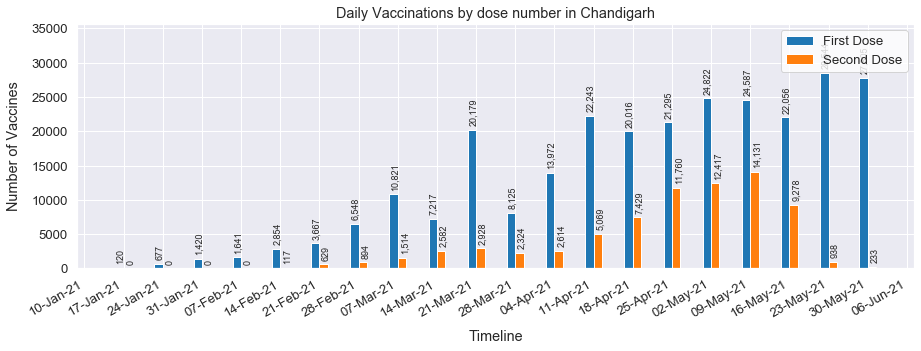

       Chhattisgarh as of 30-May-2021:  First-Dose 5,130,182;  Second-Dose 1,103,284;  Total Doses 6,233,466


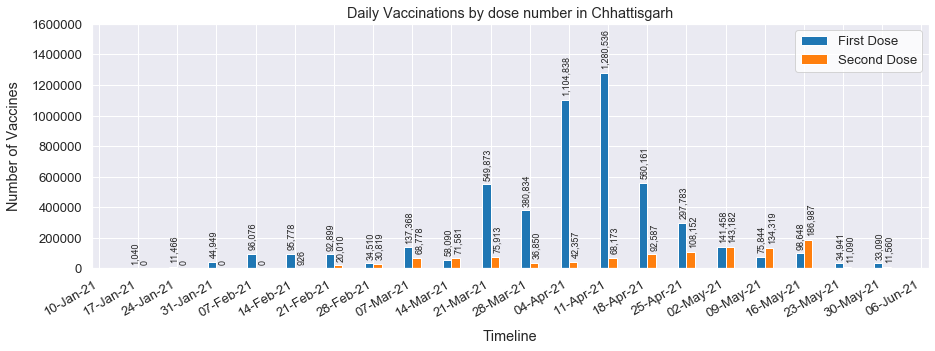

       Dadra and Nagar Haveli and Daman and Diu as of 30-May-2021:  First-Dose 163,856;  Second-Dose 25,959;  Total Doses 189,815


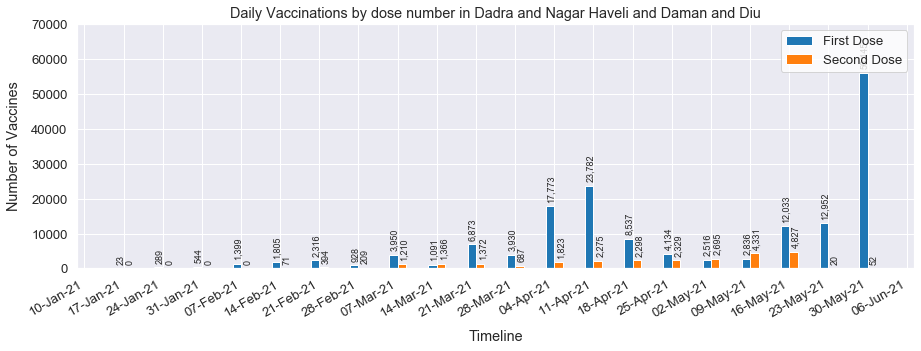

       Delhi as of 30-May-2021:  First-Dose 4,157,813;  Second-Dose 1,204,291;  Total Doses 5,362,104


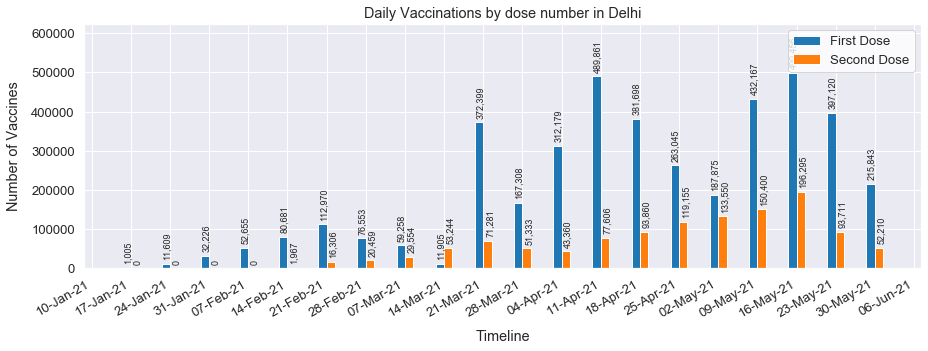

       Goa as of 30-May-2021:  First-Dose 429,393;  Second-Dose 94,979;  Total Doses 524,372


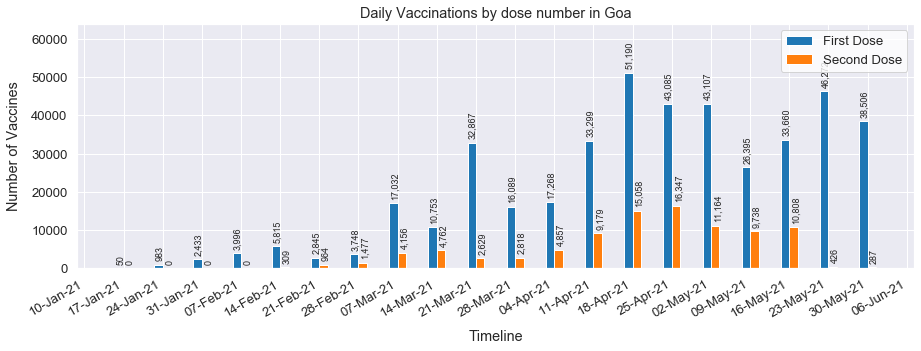

       Gujarat as of 30-May-2021:  First-Dose 12,795,634;  Second-Dose 4,114,611;  Total Doses 16,910,245


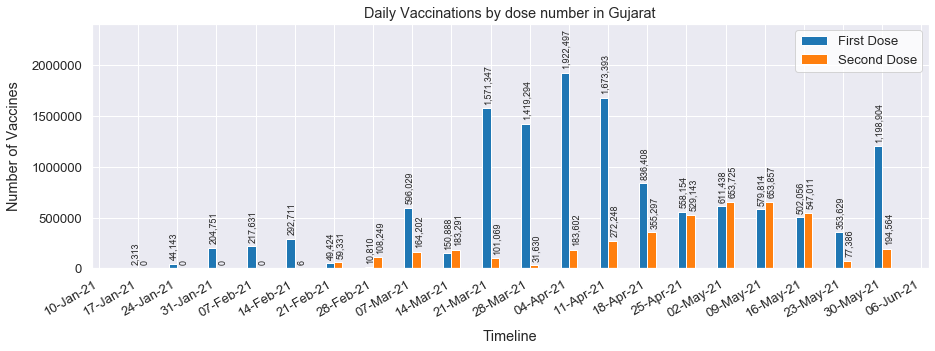

       Haryana as of 30-May-2021:  First-Dose 4,841,864;  Second-Dose 990,464;  Total Doses 5,832,328


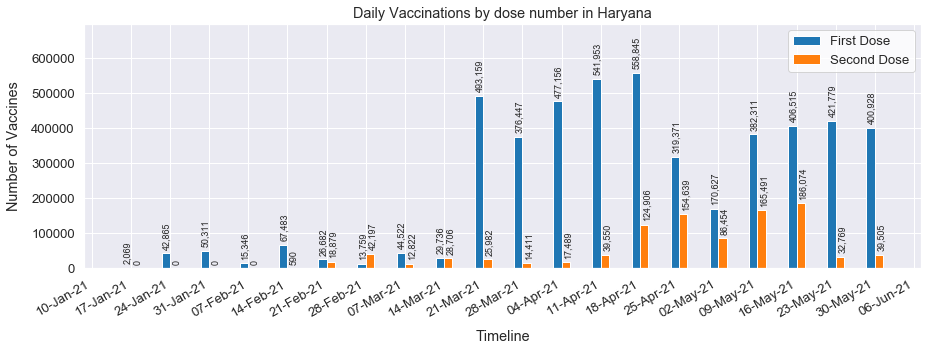

       Himachal Pradesh as of 30-May-2021:  First-Dose 1,997,579;  Second-Dose 433,612;  Total Doses 2,431,191


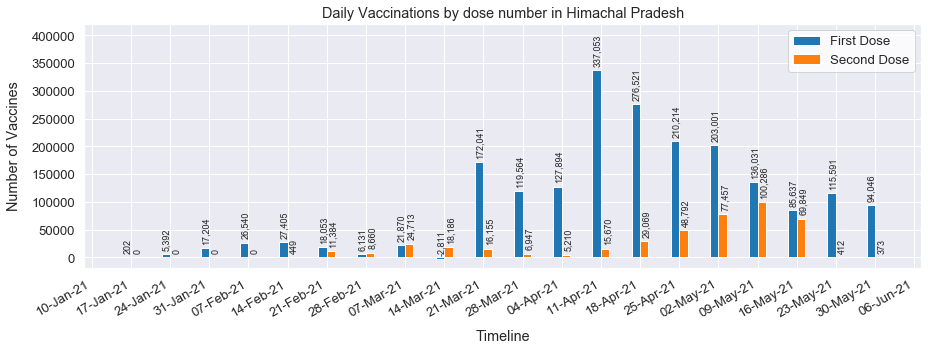

       Jammu and Kashmir as of 30-May-2021:  First-Dose 2,722,017;  Second-Dose 543,425;  Total Doses 3,265,442


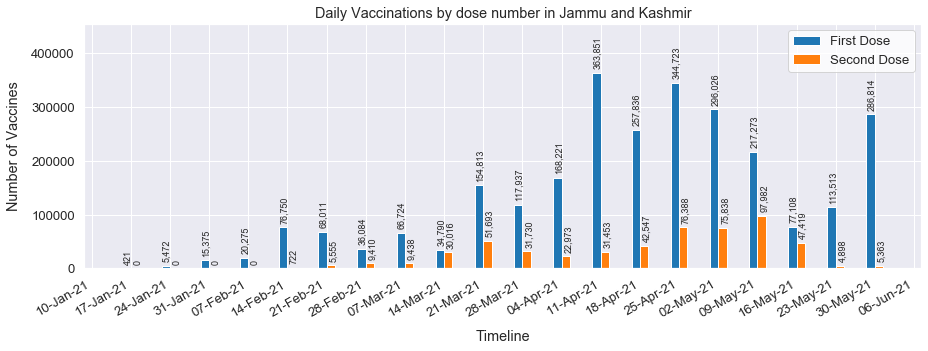

       Jharkhand as of 30-May-2021:  First-Dose 3,452,239;  Second-Dose 704,537;  Total Doses 4,156,776


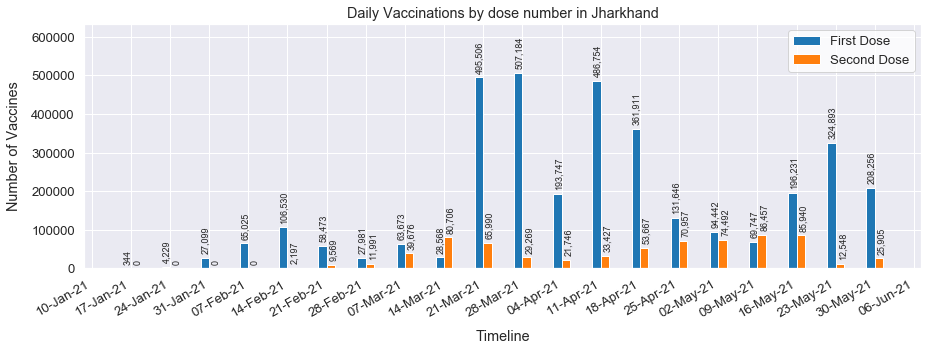

       Karnataka as of 30-May-2021:  First-Dose 10,709,480;  Second-Dose 2,730,328;  Total Doses 13,439,808


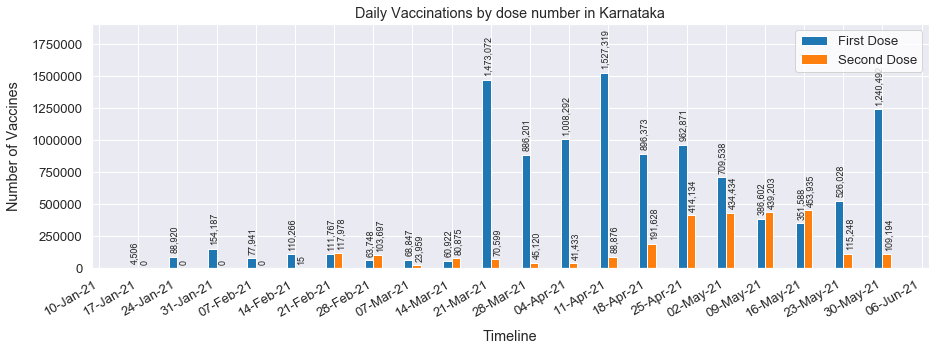

       Kerala as of 30-May-2021:  First-Dose 7,190,905;  Second-Dose 2,050,551;  Total Doses 9,241,456


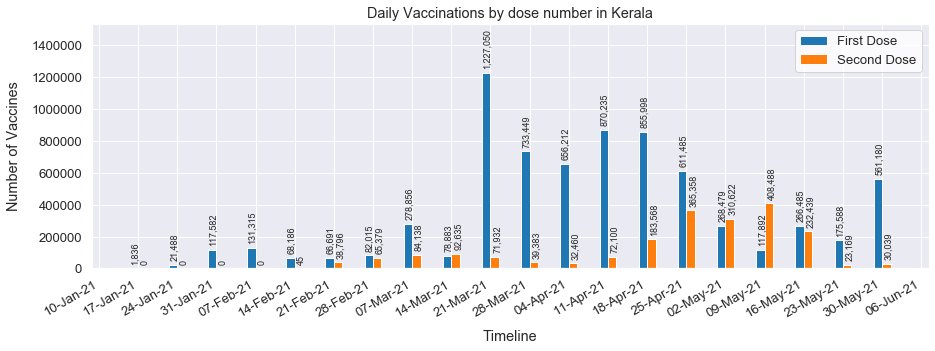

       Ladakh as of 30-May-2021:  First-Dose 116,856;  Second-Dose 37,279;  Total Doses 154,135


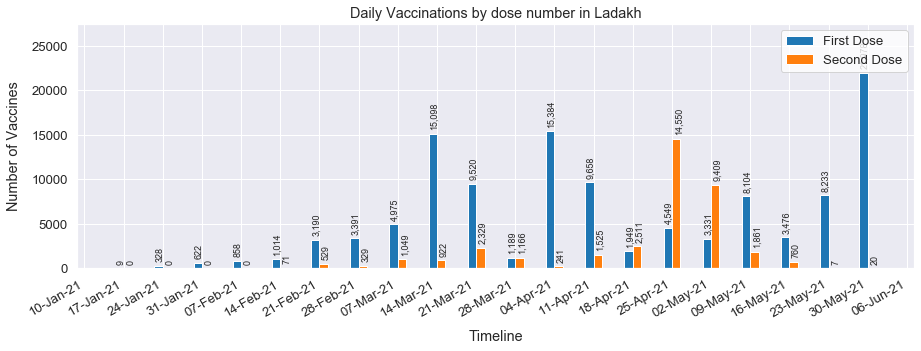

       Lakshadweep as of 30-May-2021:  First-Dose 25,870;  Second-Dose 6,948;  Total Doses 32,818


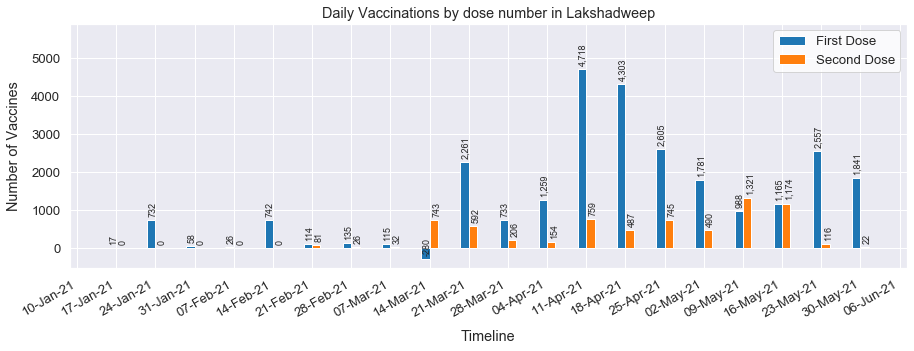

       Madhya Pradesh as of 30-May-2021:  First-Dose 9,115,504;  Second-Dose 1,784,443;  Total Doses 10,899,947


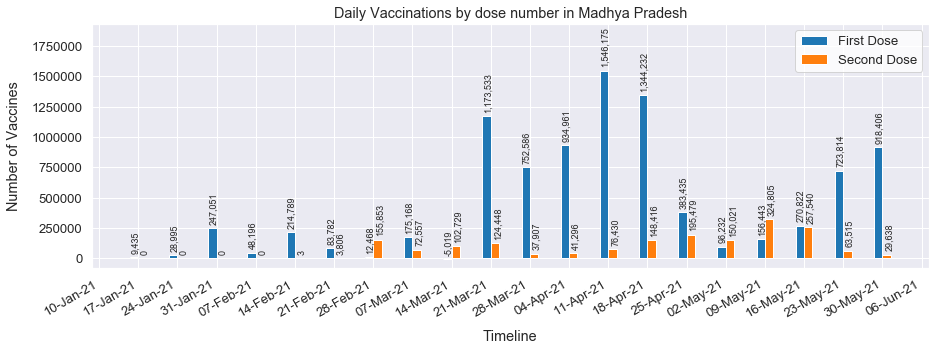

       Maharashtra as of 30-May-2021:  First-Dose 17,787,436;  Second-Dose 4,532,220;  Total Doses 22,319,656


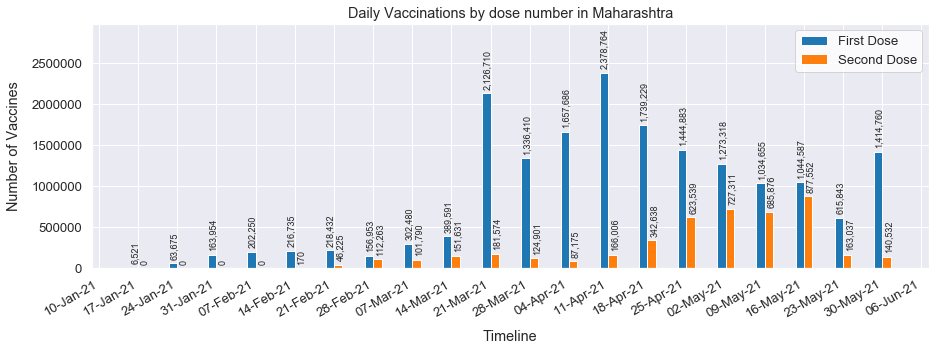

       Manipur as of 30-May-2021:  First-Dose 380,882;  Second-Dose 70,337;  Total Doses 451,219


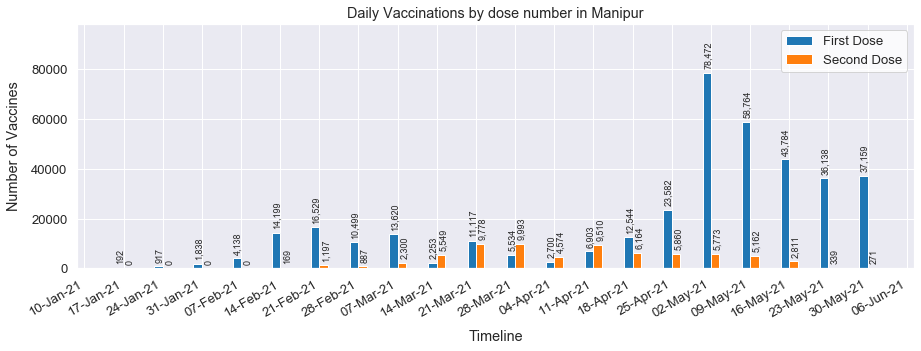

       Meghalaya as of 30-May-2021:  First-Dose 389,900;  Second-Dose 74,324;  Total Doses 464,224


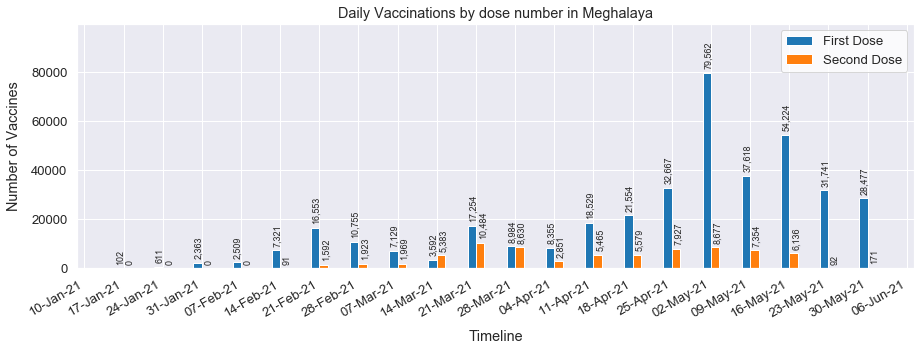

       Mizoram as of 30-May-2021:  First-Dose 262,366;  Second-Dose 51,087;  Total Doses 313,453


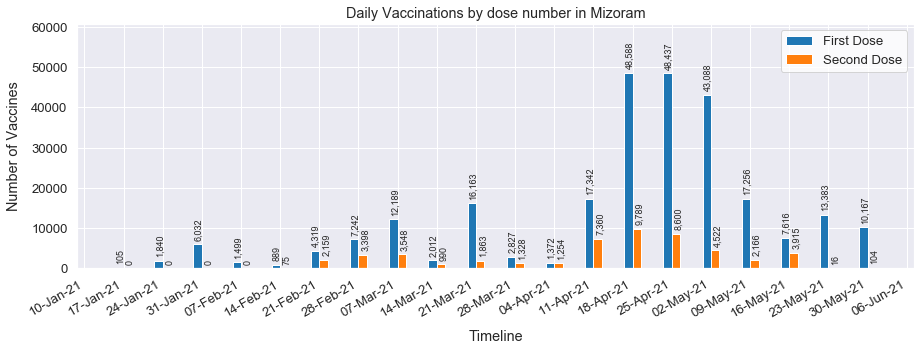

       Nagaland as of 30-May-2021:  First-Dose 210,641;  Second-Dose 51,930;  Total Doses 262,571


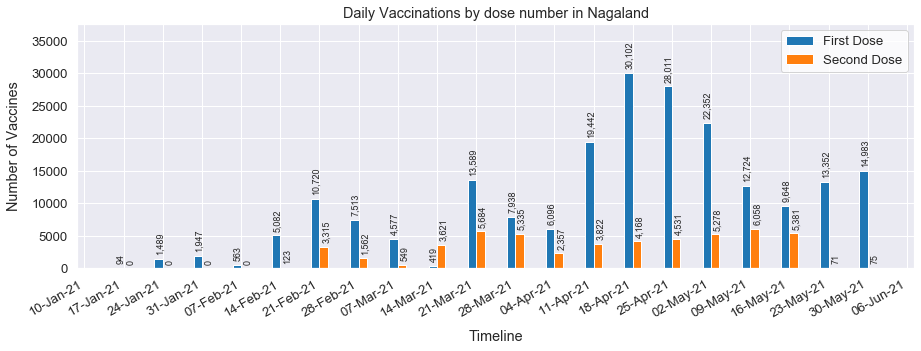

       Odisha as of 30-May-2021:  First-Dose 6,257,322;  Second-Dose 1,470,648;  Total Doses 7,727,970


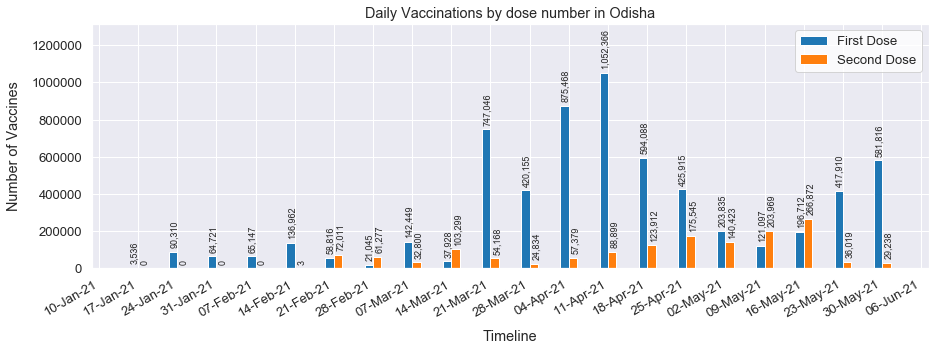

       Puducherry as of 30-May-2021:  First-Dose 214,593;  Second-Dose 51,175;  Total Doses 265,768


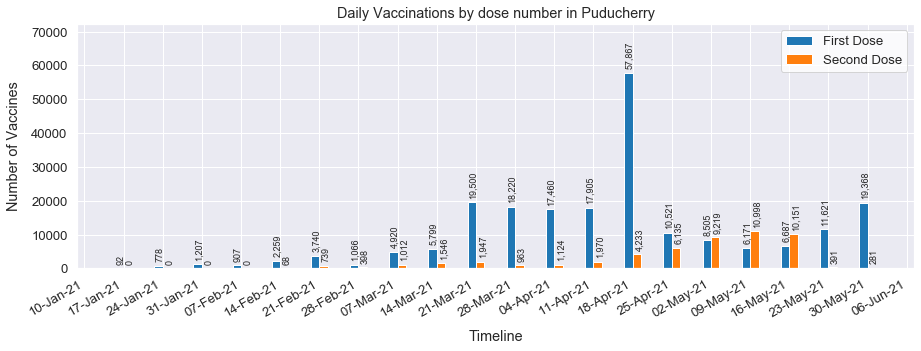

       Punjab as of 30-May-2021:  First-Dose 3,837,481;  Second-Dose 765,110;  Total Doses 4,602,591


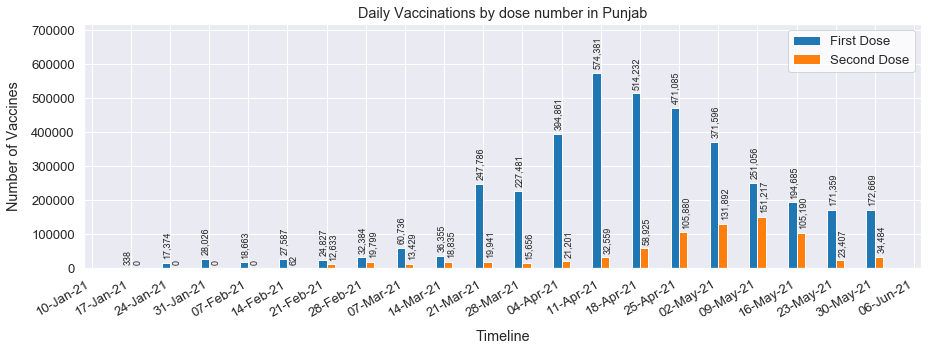

       Rajasthan as of 30-May-2021:  First-Dose 13,767,364;  Second-Dose 3,098,294;  Total Doses 16,865,658


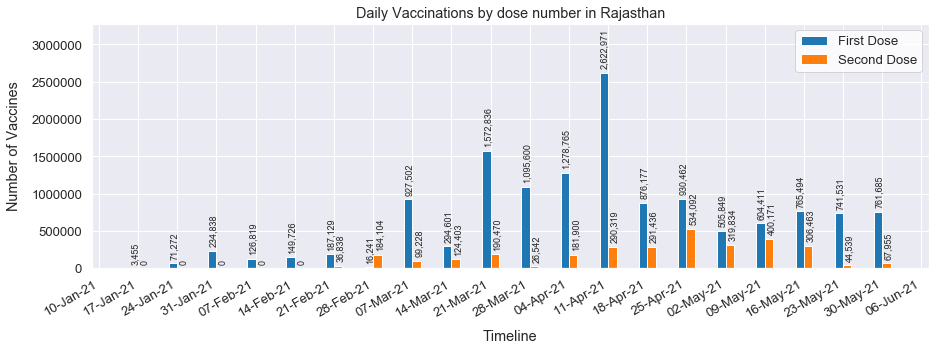

       Sikkim as of 30-May-2021:  First-Dose 179,238;  Second-Dose 59,653;  Total Doses 238,891


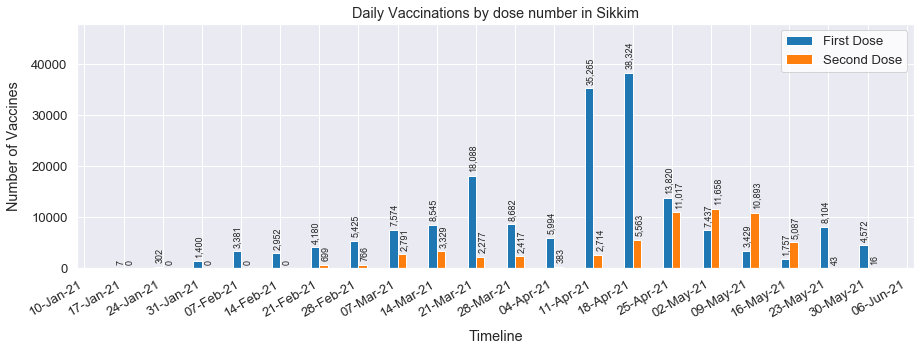

       Tamil Nadu as of 30-May-2021:  First-Dose 6,875,084;  Second-Dose 2,018,914;  Total Doses 8,893,998


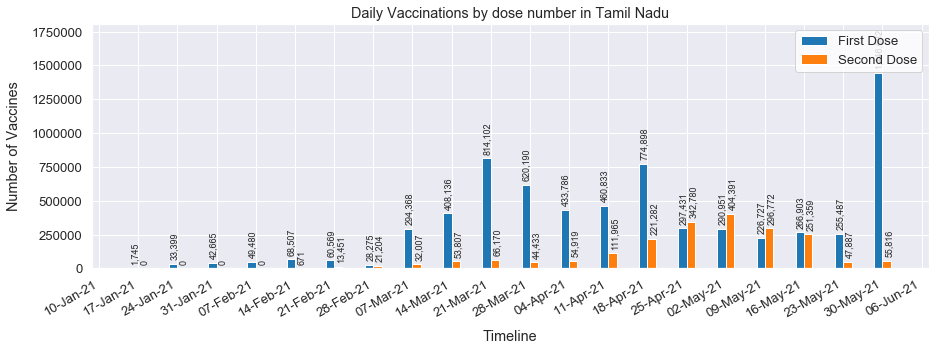

       Telangana as of 30-May-2021:  First-Dose 4,737,360;  Second-Dose 1,248,100;  Total Doses 5,985,460


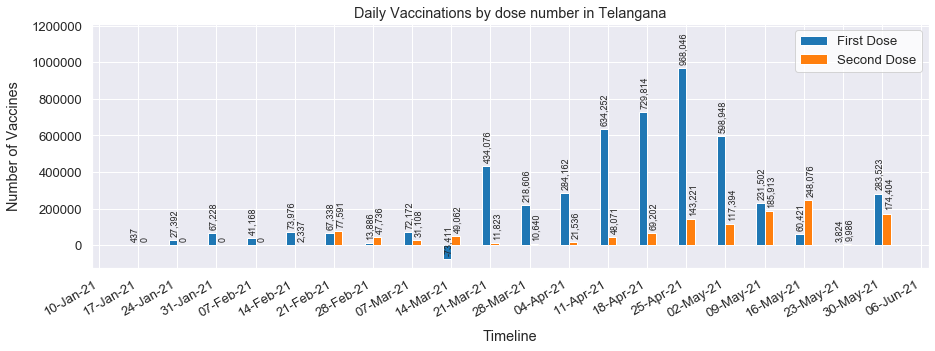

       Tripura as of 30-May-2021:  First-Dose 1,094,499;  Second-Dose 507,578;  Total Doses 1,602,077


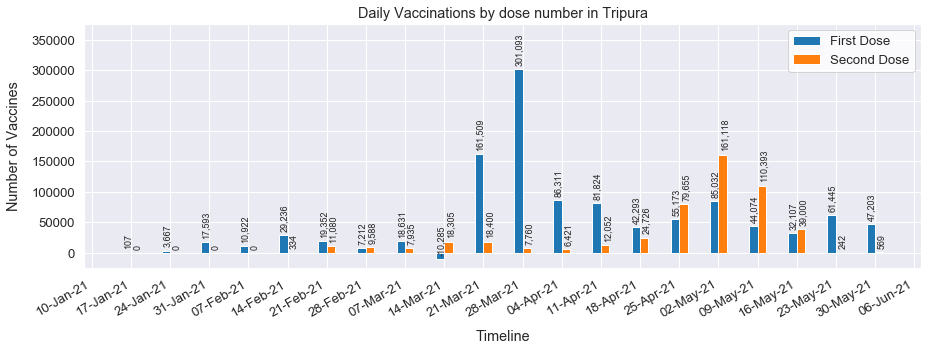

       Uttar Pradesh as of 30-May-2021:  First-Dose 14,560,582;  Second-Dose 3,450,329;  Total Doses 18,010,911


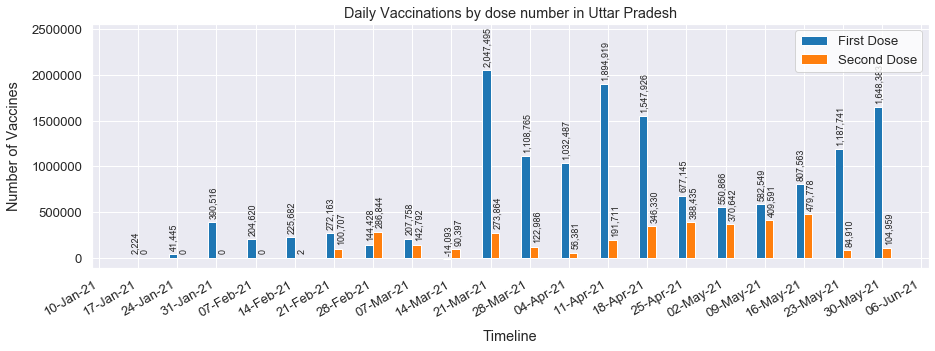

       Uttarakhand as of 30-May-2021:  First-Dose 2,218,328;  Second-Dose 683,286;  Total Doses 2,901,614


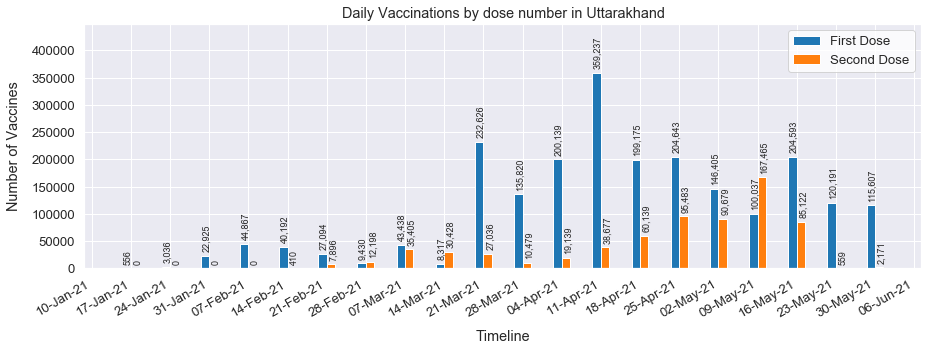

       West Bengal as of 30-May-2021:  First-Dose 10,547,015;  Second-Dose 3,865,954;  Total Doses 14,412,969


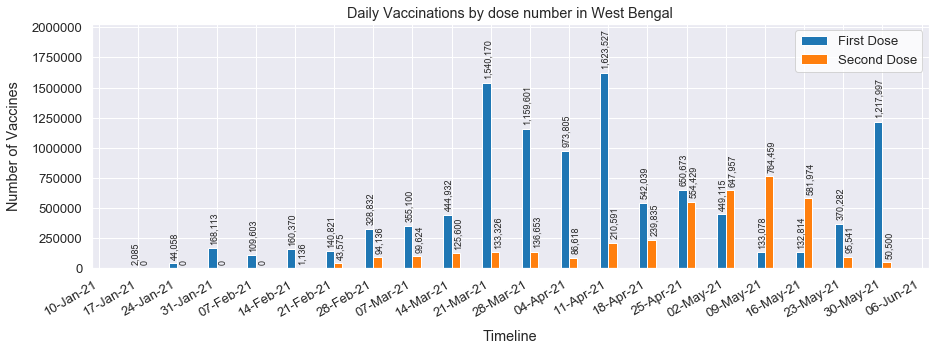

In [41]:
## Plotting daily vaccination jabs by Dose number for every State and UT
for state in states:
    daily_vaccination_plotter_by_dose_number(state)

## c. Daily Vaccinated Individuals by Age Group

In [42]:
## Subset the data only for the time post which age data is available in the dataframe
age_df = mod_df[mod_df['Updated On']>'2021-03-15']
age_df = age_df[['Updated On', 'State','18-45 years (Age)', '45-60 years (Age)', '60+ years (Age)']]
age_df['Total Individuals Vaccinated'] = age_df[['18-45 years (Age)', '45-60 years (Age)', '60+ years (Age)']].sum(axis=1)
age_df.head()

,Updated On,State,18-45 years (Age),45-60 years (Age),60+ years (Age),Total Individuals Vaccinated
59,2021-03-16,Andaman and Nicobar Islands,4663,6173,1111,11947
60,2021-03-17,Andaman and Nicobar Islands,19,107,433,559
61,2021-03-18,Andaman and Nicobar Islands,35,72,332,439
62,2021-03-19,Andaman and Nicobar Islands,31,126,188,345
63,2021-03-20,Andaman and Nicobar Islands,58,182,319,559


In [43]:
## Define a function to plot number of daily vaccinated individuals by age group
def individual_age_plotter(state):
    
    ## Filter for State and find the most latest observation and print the summary numbers of vaccines till date
    df = vac[vac['State']==state]
    last_entry = df[df['Updated On'] == df['Updated On'].max()]
    str_to_print = '       '+state+' as of '+last_entry['Updated On'].iloc[0].strftime("%d-%b-%Y")+': '+\
        ' 18-45 yrs: '+'{:,}'.format(int(last_entry['18-45 years (Age)'].iloc[0]))+'; '+\
        ' 45-60 yrs: '+'{:,}'.format(int(last_entry['45-60 years (Age)'].iloc[0]))+'; '+\
        ' 60+ yrs: '+'{:,}'.format(int(last_entry['60+ years (Age)'].iloc[0]))+'; '+\
        ' Total: '+'{:,}'.format(int(last_entry['18-45 years (Age)'].iloc[0] +\
                                    last_entry['45-60 years (Age)'].iloc[0] +\
                                    last_entry['60+ years (Age)'].iloc[0]))
    print(str_to_print.center(width))
    
    ## Filter for State and summarize daily numbers on weekly level
    state_df = age_df[age_df['State']==state]
    data = state_df.resample('W',on='Updated On').sum()
    data.reset_index(inplace=True)
    
    ## On any given day, calculate how much percentage of vacciated individuals belonged to each category  
    data['18-45 pct'] = round(data['18-45 years (Age)']/data['Total Individuals Vaccinated']*100,2)
    data['45-60 pct'] = round(data['45-60 years (Age)']/data['Total Individuals Vaccinated']*100,2)
    data['60+ pct'] = round(data['60+ years (Age)']/data['Total Individuals Vaccinated']*100,2)

    ## Create a new columns including both absolute numbers and percent to display as text on labels
    data['18-45'] = data['18-45 years (Age)'].apply(lambda x: '{:,}'.format(x)) + ' (' + data['18-45 pct'].apply(str) + '%)'
    data['45-60'] = data['45-60 years (Age)'].apply(lambda x: '{:,}'.format(x)) + ' (' + data['45-60 pct'].apply(str) + '%)'
    data['60+'] = data['60+ years (Age)'].apply(lambda x: '{:,}'.format(x)) + ' (' + data['60+ pct'].apply(str) + '%)'
    
    ## Creating Plots
    fig, ax = plt.subplots(figsize=(15,5))

    ## Plots for Daily Administered Doses of CoviShield and Covaxin over time
    ax.bar(mdates.date2num(data['Updated On'])-1.5,data['18-45 years (Age)'],label='18-45',width=1.5)
    ax.bar(mdates.date2num(data['Updated On'])+0,data['45-60 years (Age)'],label='45-60',width=1.5)
    ax.bar(mdates.date2num(data['Updated On'])+1.5,data['60+ years (Age)'],label='60+',width=1.5)
    plt.legend(loc=1,facecolor='White')

    ## Formatting X-axis for appropriate Date format, Major and Minor Ticks along with axis limits
    date_form = DateFormatter("%d-%b-%y")
    ax.xaxis.set_major_formatter(date_form)
    ax.xaxis.set_major_locator(mdates.WeekdayLocator(interval=1,byweekday=(6)))
    _, y_top = ax.get_ylim()

    ## Using a loop to plot text for all the points of each of the 3 trend lines
    for i in range(len(data)):
            ax.text(mdates.date2num(data['Updated On'].iloc[i])-1.7, y_top/40 + data['18-45 years (Age)'].iloc[i], data['18-45'].iloc[i], rotation=90, size = 9)
            ax.text(mdates.date2num(data['Updated On'].iloc[i])-0.2, y_top/40 + data['45-60 years (Age)'].iloc[i], data['45-60'].iloc[i], rotation=90, size = 9)
            ax.text(mdates.date2num(data['Updated On'].iloc[i])+1.3, y_top/40 + data['60+ years (Age)'].iloc[i],data['60+'].iloc[i],   rotation=90, size = 9)

    ## Adding Labels
    ax.set_ylim(top=data[['18-45 years (Age)','45-60 years (Age)', '60+ years (Age)']].max().max()*1.6)
    plt.xlabel('Timeline',labelpad=10)
    plt.ylabel('Number of Individuals Vaccinated',labelpad=10)
    plt.title('Vaccinated Individuals Age wise composition of '+state)
    plt.show()

       India as of 30-May-2021:  18-45 yrs: 35,054,344;  45-60 yrs: 71,584,500;  60+ yrs: 59,137,269;  Total: 165,776,113


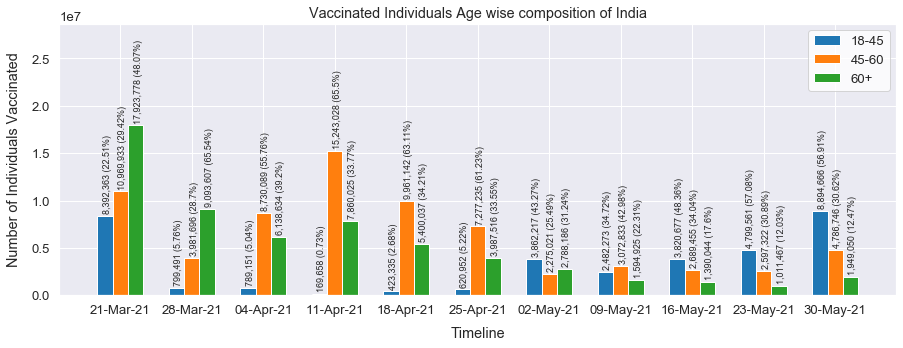

In [44]:
## Plotting number of daily vaccinated individuals by age group for India as a whole
individual_age_plotter('India')

       Andaman and Nicobar Islands as of 30-May-2021:  18-45 yrs: 17,521;  45-60 yrs: 60,410;  60+ yrs: 30,625;  Total: 108,556


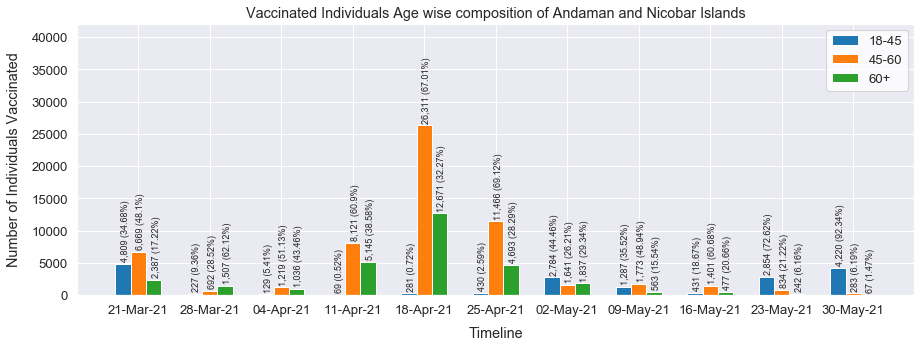

       Andhra Pradesh as of 30-May-2021:  18-45 yrs: 1,089,302;  45-60 yrs: 3,673,174;  60+ yrs: 2,524,538;  Total: 7,287,014


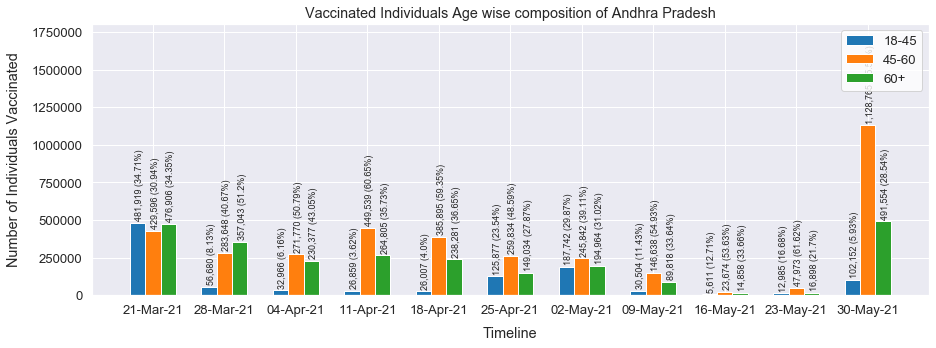

       Arunachal Pradesh as of 30-May-2021:  18-45 yrs: 89,641;  45-60 yrs: 118,772;  60+ yrs: 46,343;  Total: 254,756


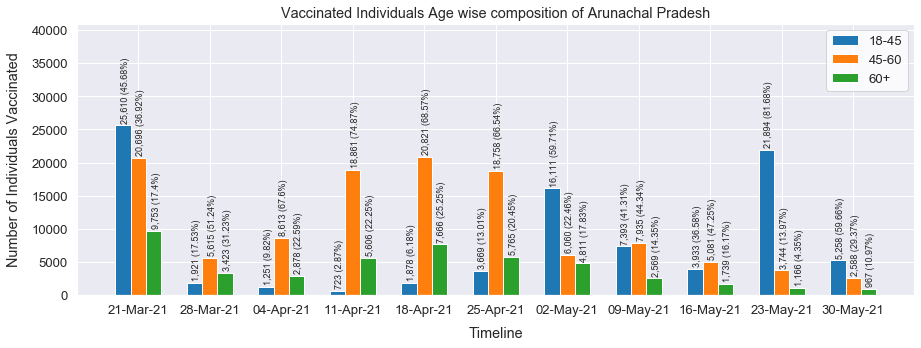

       Assam as of 30-May-2021:  18-45 yrs: 932,507;  45-60 yrs: 1,516,734;  60+ yrs: 815,868;  Total: 3,265,109


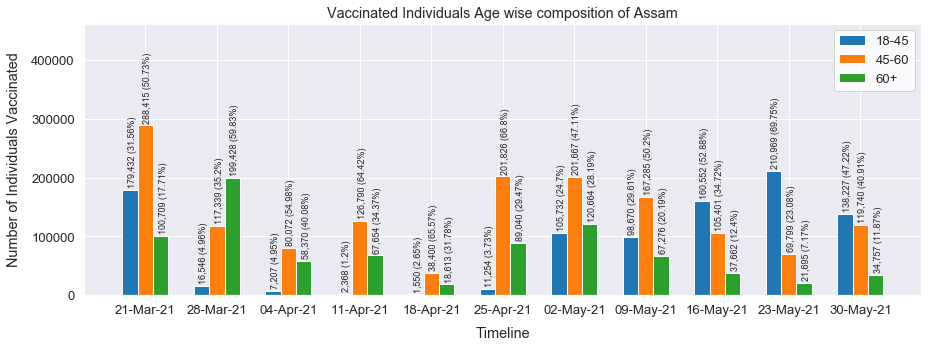

       Bihar as of 30-May-2021:  18-45 yrs: 2,270,460;  45-60 yrs: 2,945,260;  60+ yrs: 3,249,828;  Total: 8,465,548


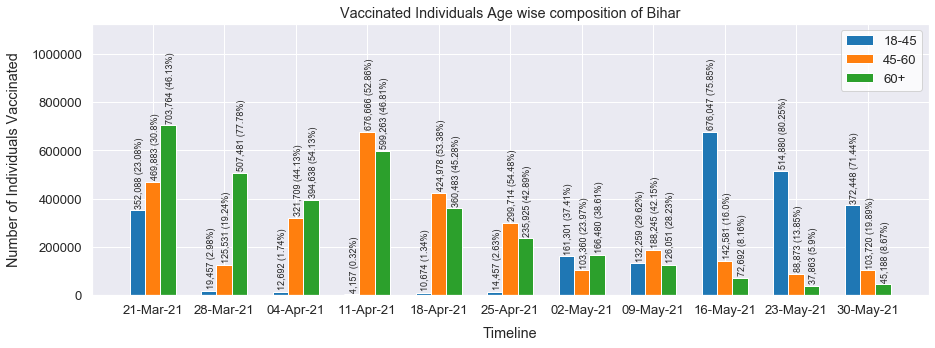

       Chandigarh as of 30-May-2021:  18-45 yrs: 73,139;  45-60 yrs: 118,889;  60+ yrs: 76,500;  Total: 268,528


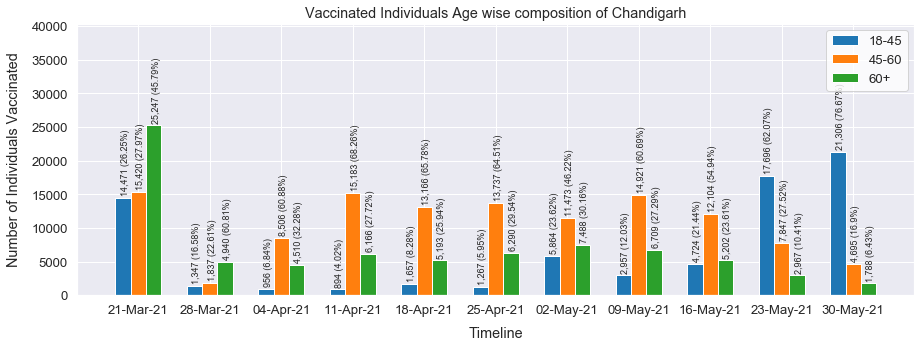

       Chhattisgarh as of 30-May-2021:  18-45 yrs: 462,917;  45-60 yrs: 2,919,875;  60+ yrs: 1,747,046;  Total: 5,129,838


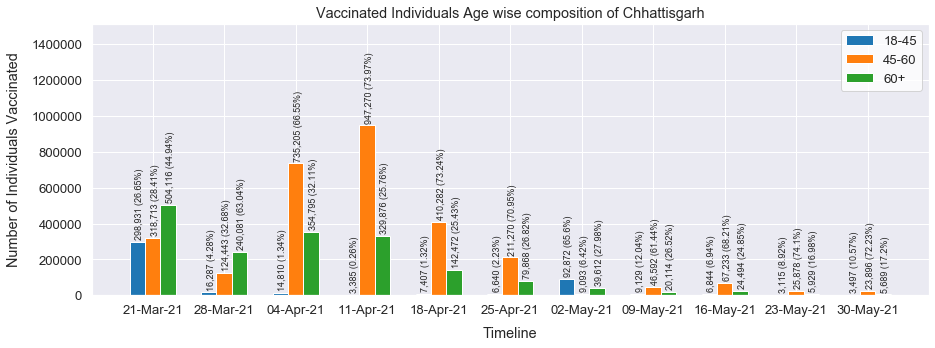

       Dadra and Nagar Haveli and Daman and Diu as of 30-May-2021:  18-45 yrs: 89,891;  45-60 yrs: 53,349;  60+ yrs: 20,549;  Total: 163,789


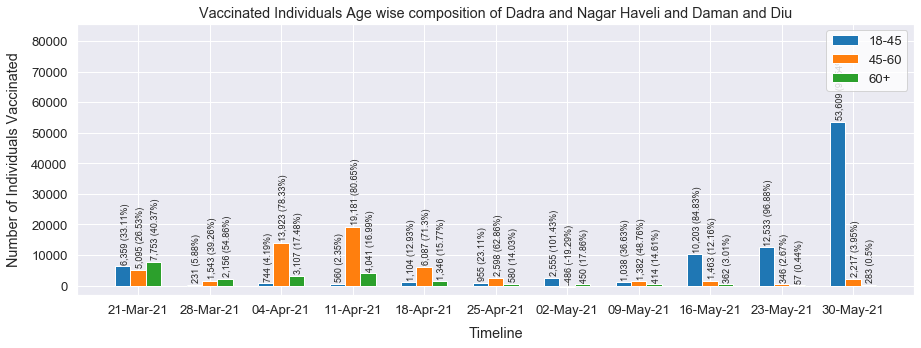

       Delhi as of 30-May-2021:  18-45 yrs: 1,508,035;  45-60 yrs: 1,632,202;  60+ yrs: 1,015,113;  Total: 4,155,350


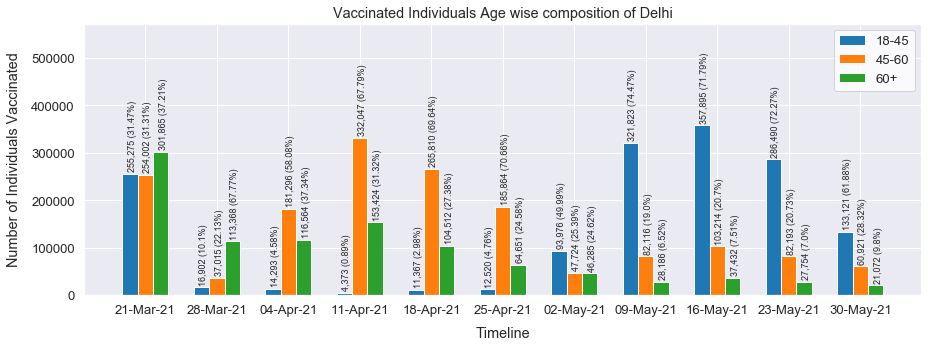

       Goa as of 30-May-2021:  18-45 yrs: 99,045;  45-60 yrs: 181,774;  60+ yrs: 148,537;  Total: 429,356


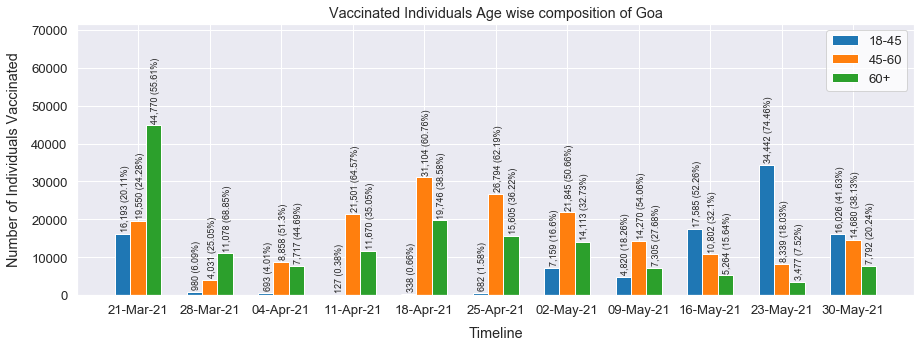

       Gujarat as of 30-May-2021:  18-45 yrs: 2,984,899;  45-60 yrs: 5,487,136;  60+ yrs: 4,320,813;  Total: 12,792,848


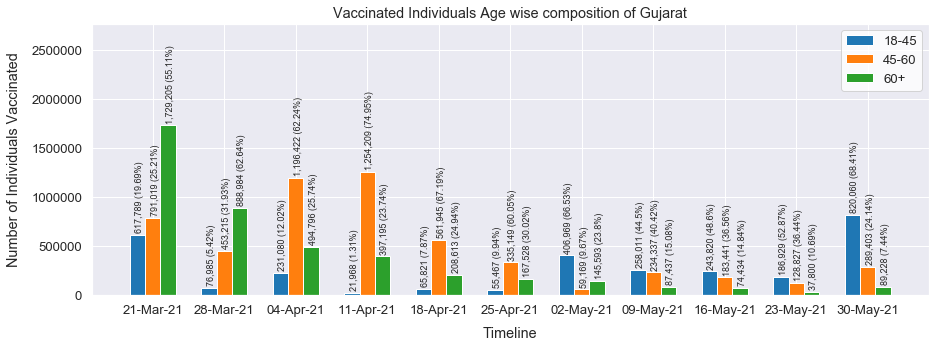

       Haryana as of 30-May-2021:  18-45 yrs: 1,333,074;  45-60 yrs: 1,777,060;  60+ yrs: 1,728,073;  Total: 4,838,207


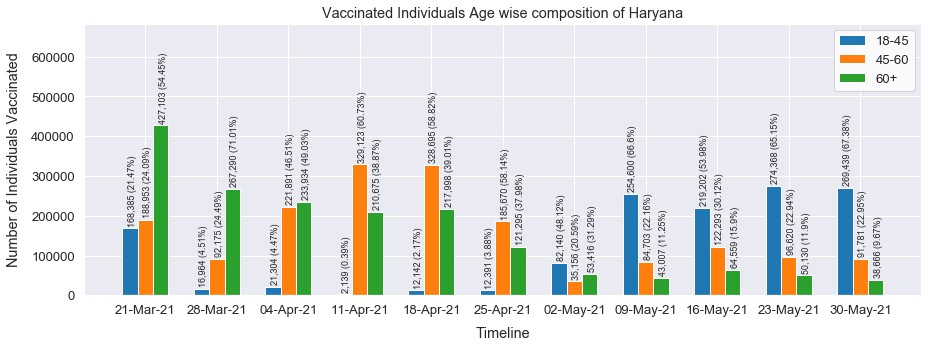

       Himachal Pradesh as of 30-May-2021:  18-45 yrs: 218,570;  45-60 yrs: 1,002,128;  60+ yrs: 776,574;  Total: 1,997,272


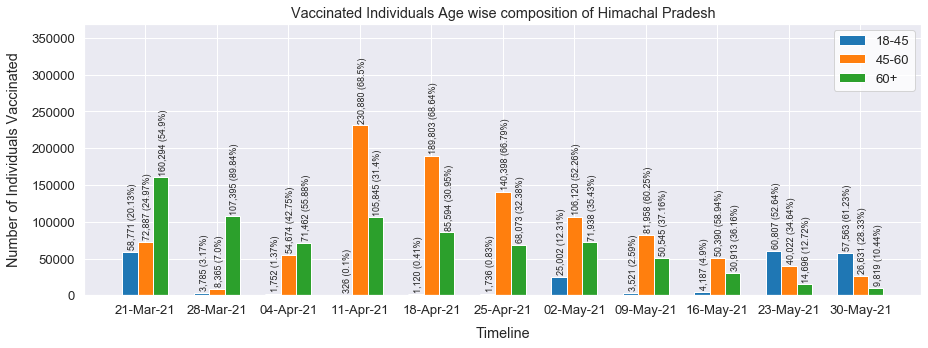

       Jammu and Kashmir as of 30-May-2021:  18-45 yrs: 478,833;  45-60 yrs: 1,354,404;  60+ yrs: 888,452;  Total: 2,721,689


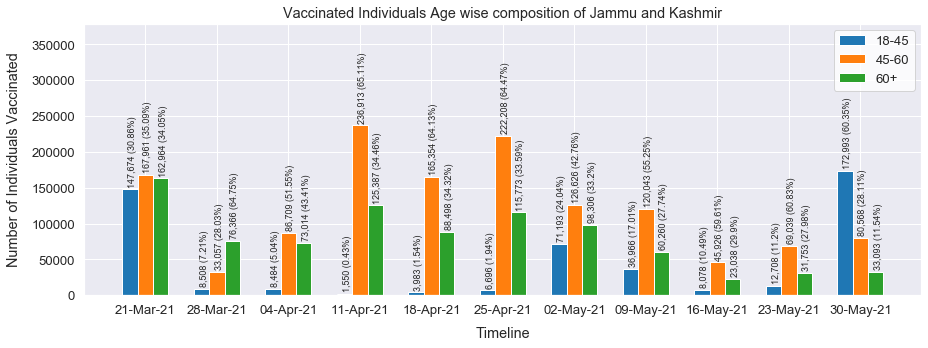

       Jharkhand as of 30-May-2021:  18-45 yrs: 902,489;  45-60 yrs: 1,343,019;  60+ yrs: 1,205,864;  Total: 3,451,372


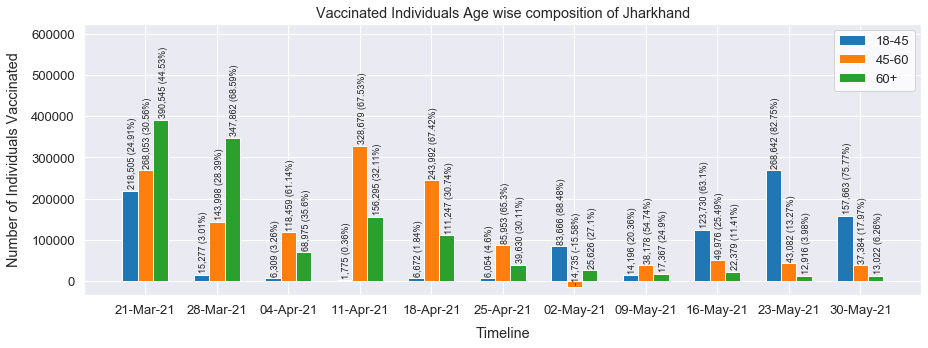

       Karnataka as of 30-May-2021:  18-45 yrs: 2,011,006;  45-60 yrs: 4,737,652;  60+ yrs: 3,956,994;  Total: 10,705,652


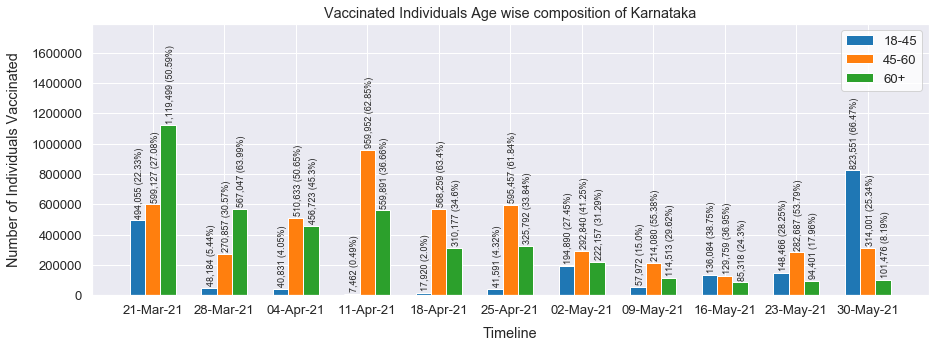

       Kerala as of 30-May-2021:  18-45 yrs: 851,898;  45-60 yrs: 2,889,453;  60+ yrs: 3,446,016;  Total: 7,187,367


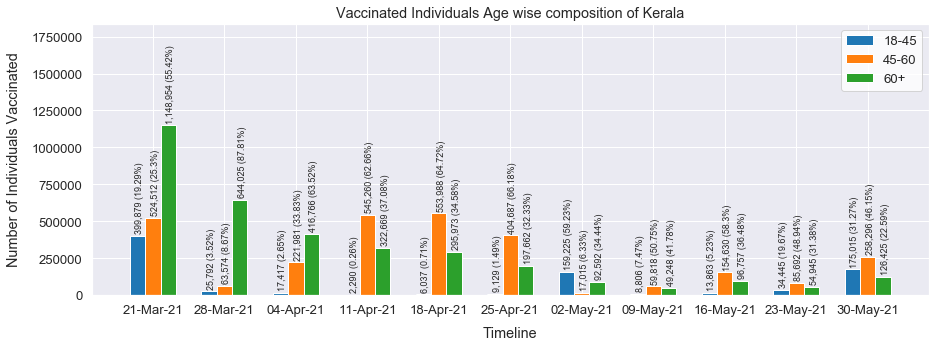

       Ladakh as of 30-May-2021:  18-45 yrs: 51,047;  45-60 yrs: 35,647;  60+ yrs: 30,139;  Total: 116,833


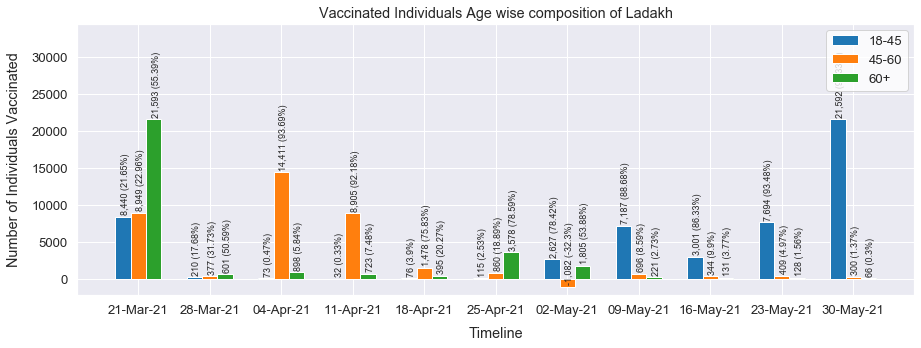

       Lakshadweep as of 30-May-2021:  18-45 yrs: 5,987;  45-60 yrs: 12,682;  60+ yrs: 7,201;  Total: 25,870


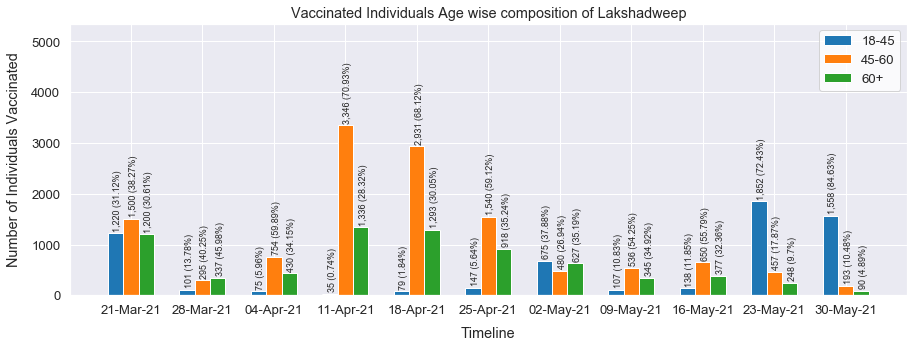

       Madhya Pradesh as of 30-May-2021:  18-45 yrs: 2,282,765;  45-60 yrs: 3,740,093;  60+ yrs: 3,090,534;  Total: 9,113,392


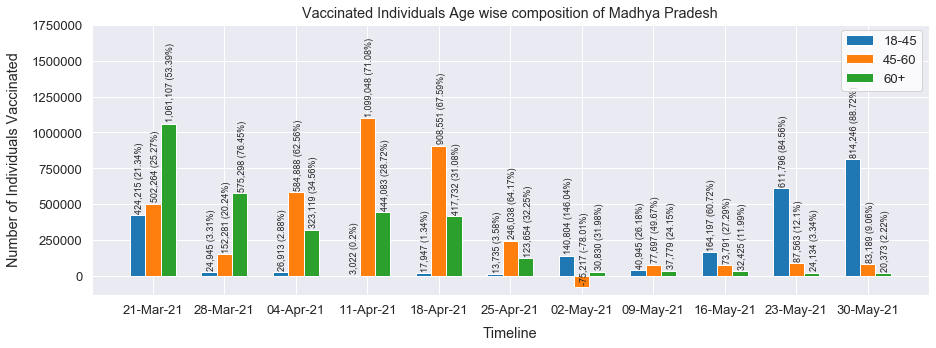

       Maharashtra as of 30-May-2021:  18-45 yrs: 3,154,007;  45-60 yrs: 7,960,373;  60+ yrs: 6,668,322;  Total: 17,782,702


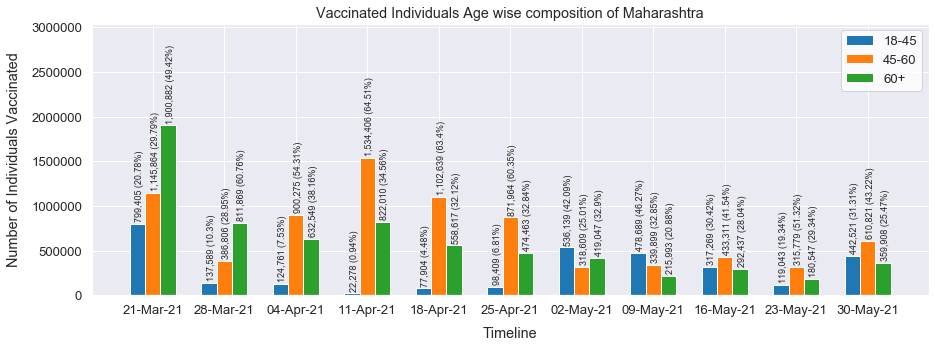

       Manipur as of 30-May-2021:  18-45 yrs: 128,473;  45-60 yrs: 161,669;  60+ yrs: 90,643;  Total: 380,785


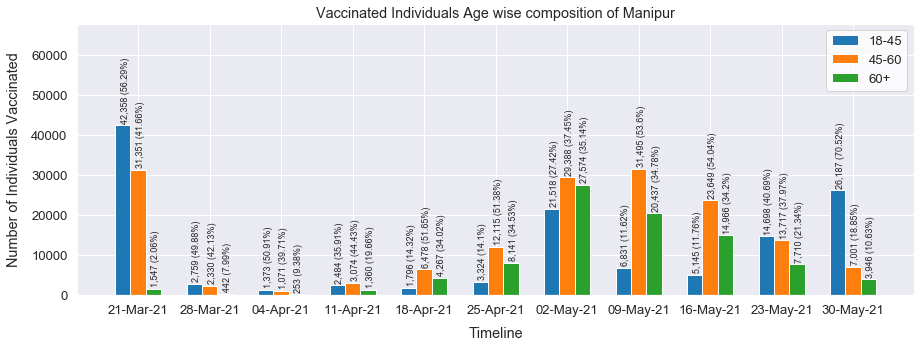

       Meghalaya as of 30-May-2021:  18-45 yrs: 138,093;  45-60 yrs: 175,203;  60+ yrs: 76,571;  Total: 389,867


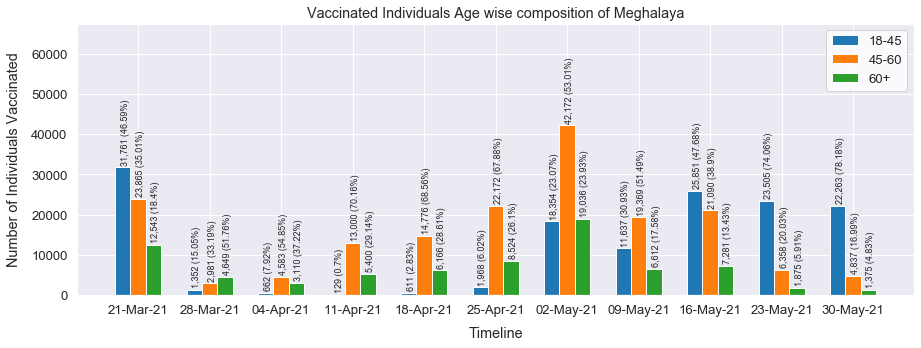

       Mizoram as of 30-May-2021:  18-45 yrs: 54,035;  45-60 yrs: 127,052;  60+ yrs: 81,253;  Total: 262,340


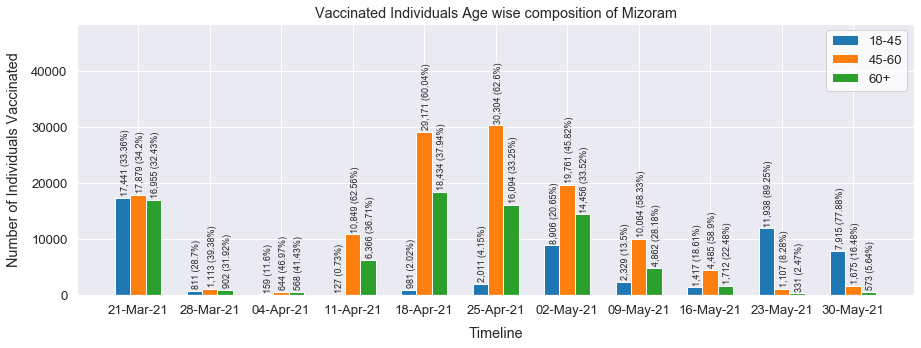

       Nagaland as of 30-May-2021:  18-45 yrs: 71,690;  45-60 yrs: 88,465;  60+ yrs: 50,457;  Total: 210,612


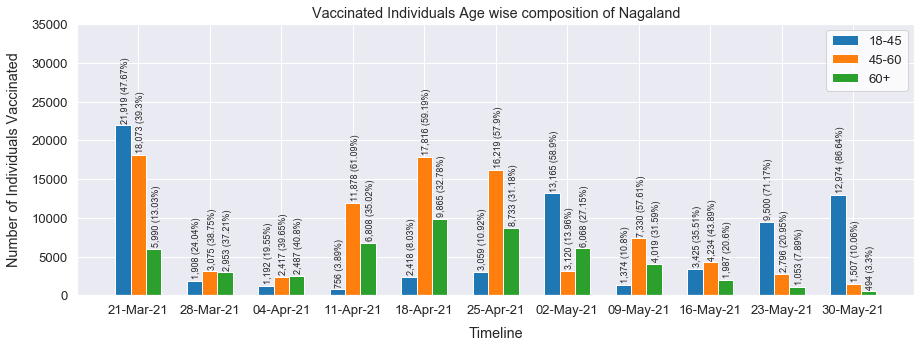

       Odisha as of 30-May-2021:  18-45 yrs: 1,179,750;  45-60 yrs: 2,632,743;  60+ yrs: 2,443,784;  Total: 6,256,277


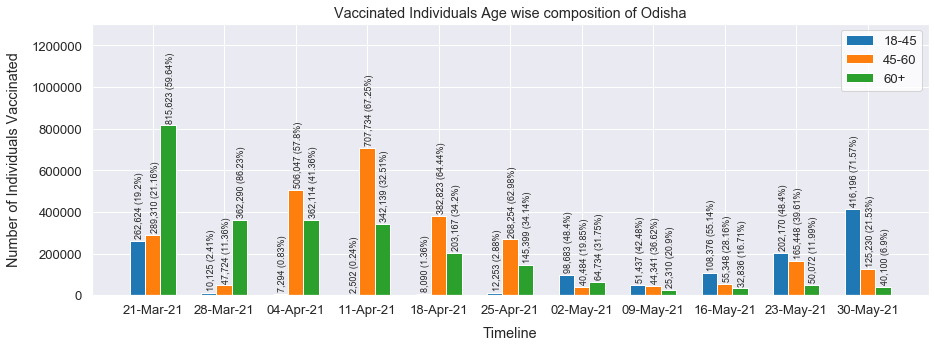

       Puducherry as of 30-May-2021:  18-45 yrs: 62,966;  45-60 yrs: 86,394;  60+ yrs: 65,164;  Total: 214,524


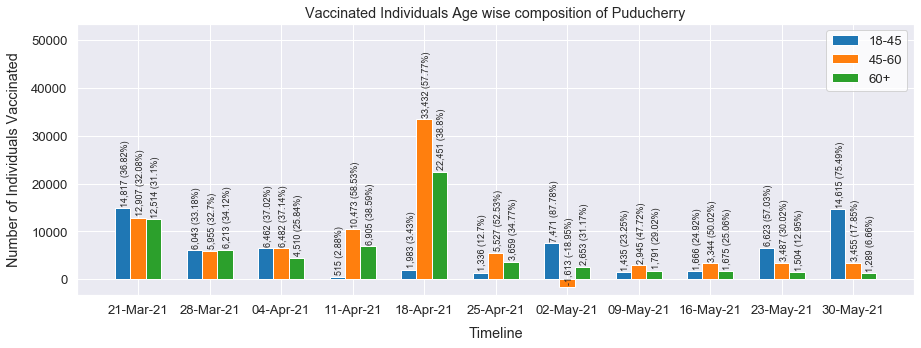

       Punjab as of 30-May-2021:  18-45 yrs: 836,417;  45-60 yrs: 1,666,768;  60+ yrs: 1,333,750;  Total: 3,836,935


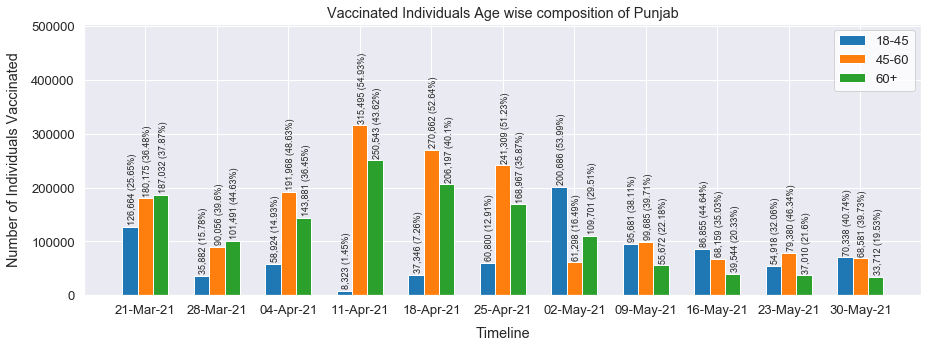

       Rajasthan as of 30-May-2021:  18-45 yrs: 2,646,119;  45-60 yrs: 5,599,050;  60+ yrs: 5,517,802;  Total: 13,762,971


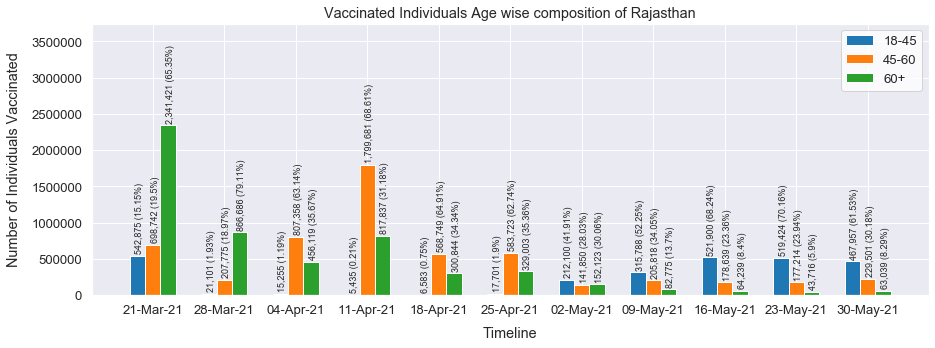

       Sikkim as of 30-May-2021:  18-45 yrs: 31,609;  45-60 yrs: 92,315;  60+ yrs: 55,301;  Total: 179,225


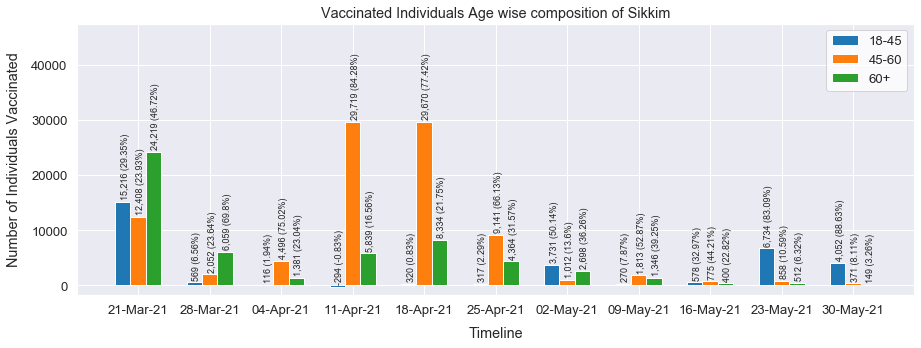

       Tamil Nadu as of 30-May-2021:  18-45 yrs: 2,205,561;  45-60 yrs: 2,702,698;  60+ yrs: 1,965,148;  Total: 6,873,407


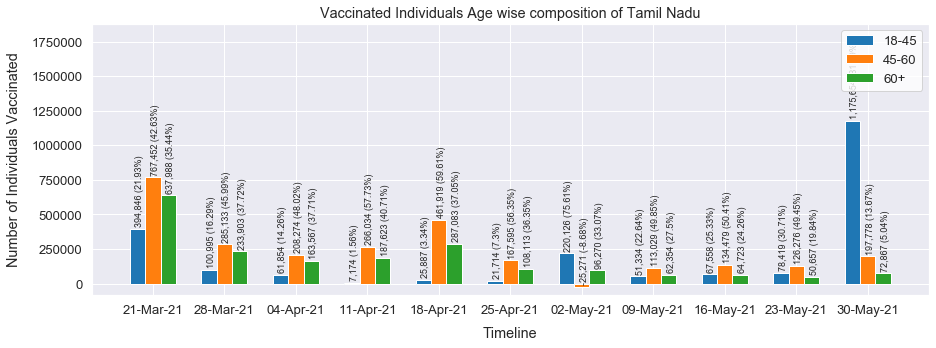

       Telangana as of 30-May-2021:  18-45 yrs: 655,169;  45-60 yrs: 2,454,228;  60+ yrs: 1,627,019;  Total: 4,736,416


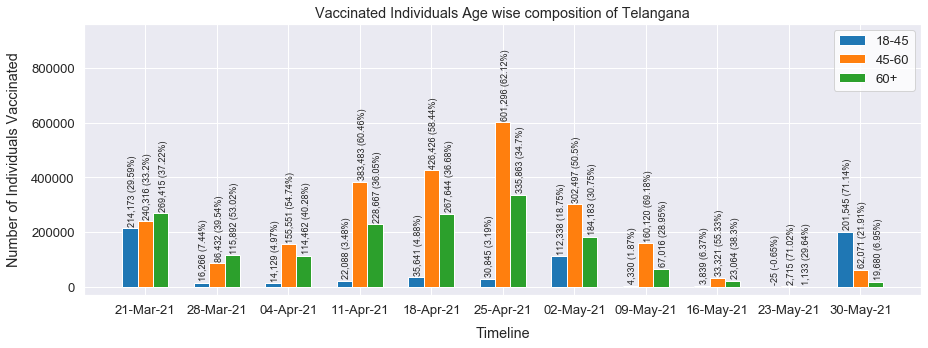

       Tripura as of 30-May-2021:  18-45 yrs: 156,564;  45-60 yrs: 606,134;  60+ yrs: 331,112;  Total: 1,093,810


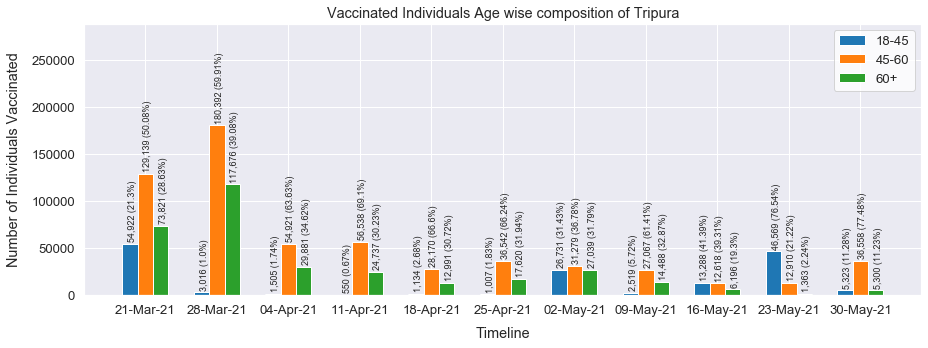

       Uttar Pradesh as of 30-May-2021:  18-45 yrs: 3,296,049;  45-60 yrs: 6,293,411;  60+ yrs: 4,965,579;  Total: 14,555,039


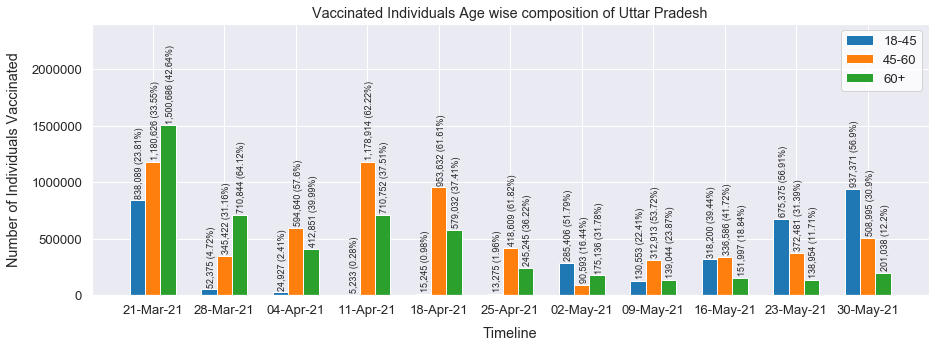

       Uttarakhand as of 30-May-2021:  18-45 yrs: 482,012;  45-60 yrs: 934,032;  60+ yrs: 801,734;  Total: 2,217,778


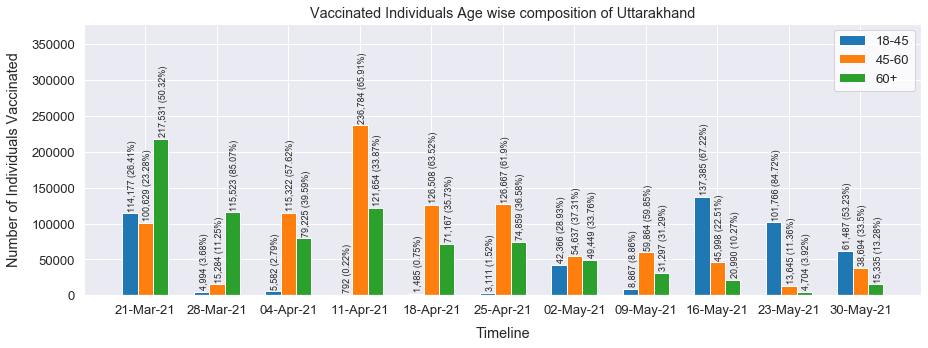

       West Bengal as of 30-May-2021:  18-45 yrs: 2,202,804;  45-60 yrs: 4,404,252;  60+ yrs: 3,938,023;  Total: 10,545,079


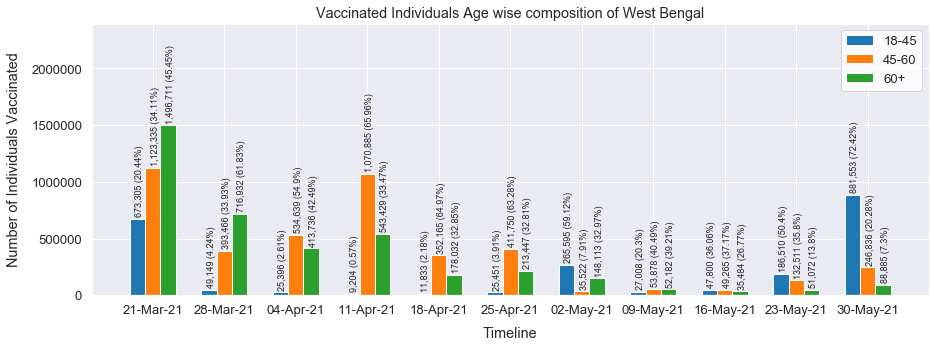

In [45]:
## Plotting number of daily vaccinated individuals by age group for every state and UT
for state in states:
    individual_age_plotter(state)